# STOCK PRICE PREDICTION

**Structure of the report**
1. **Problem Statement and Data Preparation**
2. **Data Description and Descriptive Statistics**
3. **Traditional Econometric Analysis**  
4. **AI Models Analysis**
5. **Conclusion**

## 1. Problem Statement and Data Preparation

This artificial intelligence (AI) project implemented in the Jupyter Notebook is designed to perform stock price prediction, specifically targeting the SSI Securities Corporation (SSI). Predicting stock prices within the financial industry, particularly for companies directly involved in stock trading and investment services, holds immense significance due to the sector's inherent volatility and interdependence. Forecasting stock prices of financial firms offers critical insights into market trends, regulatory changes, and economic shifts that can profoundly impact not just the company itself but the broader financial ecosystem.

This project embarks on a comprehensive journey that encompasses data exploratory analysis, leveraging traditional econometric methods like the AutoRegressive Integrated Moving Average (ARIMA) model, and harnessing the prowess of state-of-the-art deep learning models including Long Short-Term Memory (LSTM), Gated Recurrent Unit (GRU), and Transformer architectures. By amalgamating these diverse methodologies, the project strives not only to forecast SSI's stock prices but also to provide a comparative analysis of the efficacy and performance of these varied models.

**Model evaluation metrics:**
- Accuracy: The accuracy metric assesses how well predicted values align with actual values, factoring in their relative differences as a percentage of the actual values themselves. The closer the percentage is to 100%, the better the predictions align with the actual values.
- Mean Squared Error (MSE): The MSE indicates the average squared difference between the predicted and actual values. A lower MSE suggests better accuracy, though the interpretation might vary based on the scale of the data.
- Root Mean Squared Error (RMSE): The square root of MSE provides an interpretable measure in the same units as the target variable. Lower RMSE values indicate better predictive performance.
- Mean Absolute Error (MAE): The MAE measures the average absolute differences between predicted and actual values. It's less sensitive to outliers compared to MSE and RMSE.
- Mean Absolute Percentage Error (MAPE): The MAPE represents the average percentage difference between predicted and actual values. It's a relative measure and can be useful for understanding the model's performance in terms of percentage accuracy.
- R-squared: The R-squared value indicates the proportion of variance in the target variable explained by the model. A value closer to 1 suggests that the model captures a high percentage of the variance in the data, indicating a strong fit.

**Set up**

In [ ]:
import sys
print(sys.executable)

/Users/user/.conda/envs/PythonProject/bin/python


In [ ]:
# Install vnstock from PyPI - stable version
!!'/Users/user/.conda/envs/PythonProject/bin/python' -m pip install -U vnstock

# Import necessary functions or classes
from vnstock import *

**Get historical price of SSI**

In [ ]:
# Get historical price available from 20/03/2012 to 28/12/2023
ssi = stock_historical_data("SSI", "2012-03-20", "2023-12-28", "1D", "stock")

# Display the first five rows
ssi.head()

,time,open,high,low,close,volume,ticker
0,2012-03-20,5170,5290,5110,5290,2018790,SSI
1,2012-03-21,5350,5560,5320,5380,2955280,SSI
2,2012-03-22,5270,5460,5240,5270,2388550,SSI
3,2012-03-23,5270,5500,5270,5460,2609850,SSI
4,2012-03-26,5500,5500,5380,5380,2511360,SSI


In [ ]:
# Dropping the 'sticker' column
ssi = ssi.drop('ticker', axis=1)
ssi

,time,open,high,low,close,volume
0,2012-03-20,5170,5290,5110,5290,2018790
1,2012-03-21,5350,5560,5320,5380,2955280
2,2012-03-22,5270,5460,5240,5270,2388550
3,2012-03-23,5270,5500,5270,5460,2609850
4,2012-03-26,5500,5500,5380,5380,2511360
...,...,...,...,...,...,...
2939,2023-12-22,32350,32950,32200,32350,17457600
2940,2023-12-25,32350,32750,32100,32549,13953300
2941,2023-12-26,32600,32900,32500,32750,14005700
2942,2023-12-27,32950,33150,32800,32800,16101500


- The historical prices of SSI contains 2944 entries and 6 columns.

**Viewing Datatypes of all columns**

In [ ]:
# Get an overview of the structure and contents of the DataFrame
ssi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   time    2944 non-null   object
 1   open    2944 non-null   int64 
 2   high    2944 non-null   int64 
 3   low     2944 non-null   int64 
 4   close   2944 non-null   int64 
 5   volume  2944 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 138.1+ KB


**Remove duplications and null values**

In [ ]:
# Function to remove duplications and null values
def clean_data(df):
    df = df.drop_duplicates() # Remove duplications
    df = df.dropna() # Remove null values
    return df
ssi = clean_data(ssi)

# Get the info of the dataset again
ssi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   time    2944 non-null   object
 1   open    2944 non-null   int64 
 2   high    2944 non-null   int64 
 3   low     2944 non-null   int64 
 4   close   2944 non-null   int64 
 5   volume  2944 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 138.1+ KB


- The dataset has no null and duplicated value.
- Here, we can notice the data type of “Date” is an ‘object’, hence we need to convert it into the ‘date’ datatype.

In [ ]:
# This code snippet converts the 'time' column to a datetime format
ssi['time'] = pd.to_datetime(ssi['time'])

# Display an overview of the DataFrame 'ssi'
ssi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   time    2944 non-null   datetime64[ns]
 1   open    2944 non-null   int64         
 2   high    2944 non-null   int64         
 3   low     2944 non-null   int64         
 4   close   2944 non-null   int64         
 5   volume  2944 non-null   int64         
dtypes: datetime64[ns](1), int64(5)
memory usage: 138.1 KB


**Save as csv file**

In [ ]:
ssi.to_csv('ssi.csv', index=False)

## 2. Data Description and Descriptive Statistics

**Set up**

In [ ]:
# Import necessary packages
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

In [ ]:
# Load the dataset
df=pd.read_csv('ssi.csv', parse_dates=['time'])
df.head()

,time,open,high,low,close,volume
0,2012-03-20,5170,5290,5110,5290,2018790
1,2012-03-21,5350,5560,5320,5380,2955280
2,2012-03-22,5270,5460,5240,5270,2388550
3,2012-03-23,5270,5500,5270,5460,2609850
4,2012-03-26,5500,5500,5380,5380,2511360


**Data Description**

In [ ]:
# Creation of column 'daily_lag' - one day lag shifted of close price
df['daily_lag']=df['close'].shift(1)
df.head()

,time,open,high,low,close,volume,daily_lag
0,2012-03-20,5170,5290,5110,5290,2018790,NaN
1,2012-03-21,5350,5560,5320,5380,2955280,5290.0
2,2012-03-22,5270,5460,5240,5270,2388550,5380.0
3,2012-03-23,5270,5500,5270,5460,2609850,5270.0
4,2012-03-26,5500,5500,5380,5380,2511360,5460.0


In [ ]:
# Creation of column 'daily-return' – the percentage change between the lagged value and the current day's closing price.
df['daily_return']=(df['daily_lag']/df['close'])-1
df.head()

,time,open,high,low,close,volume,daily_lag,daily_return
0,2012-03-20,5170,5290,5110,5290,2018790,NaN,NaN
1,2012-03-21,5350,5560,5320,5380,2955280,5290.0,-0.016729
2,2012-03-22,5270,5460,5240,5270,2388550,5380.0,0.020873
3,2012-03-23,5270,5500,5270,5460,2609850,5270.0,-0.034799
4,2012-03-26,5500,5500,5380,5380,2511360,5460.0,0.014870


In [ ]:
# Data description and rounding its values up to two decimal places
df.describe().round(2)

,open,high,low,close,volume,daily_lag,daily_return
count,2944.00,2944.00,2944.00,2944.00,2944.00,2943.00,2943.00
mean,13661.85,13880.10,13447.16,13652.51,6520083.20,13645.94,-0.00
std,9324.83,9505.34,9141.07,9313.78,7761242.43,9308.53,0.02
min,3930.00,4000.00,3930.00,3950.00,137750.00,3950.00,-0.07
25%,8184.25,8290.00,8050.00,8189.00,1493690.00,8189.00,-0.01
50%,9910.00,10010.00,9780.00,9890.00,3219395.00,9890.00,0.00
75%,17197.50,17510.00,16842.50,17190.00,8636900.00,17160.00,0.01
max,49380.00,50160.00,47810.00,48590.00,69559104.00,48590.00,0.08


**Observations:**
- Notably, the mean of ‘daily_return’ is close to zero (-0.00), suggesting an almost neutral average daily return. The standard deviation of ‘daily_return’ indicates moderate volatility in the daily returns, considering its magnitude (0.02). The range between the minimum and maximum values of ‘daily_return’ (-0.07 to 0.08) illustrates the variability of daily returns over the period covered by the dataset.

**Distribution**

array([[<AxesSubplot:title={'center':'time'}>,
        <AxesSubplot:title={'center':'open'}>,
        <AxesSubplot:title={'center':'high'}>],
       [<AxesSubplot:title={'center':'low'}>,
        <AxesSubplot:title={'center':'close'}>,
        <AxesSubplot:title={'center':'volume'}>],
       [<AxesSubplot:title={'center':'daily_lag'}>,
        <AxesSubplot:title={'center':'daily_return'}>, <AxesSubplot:>]],
      dtype=object)

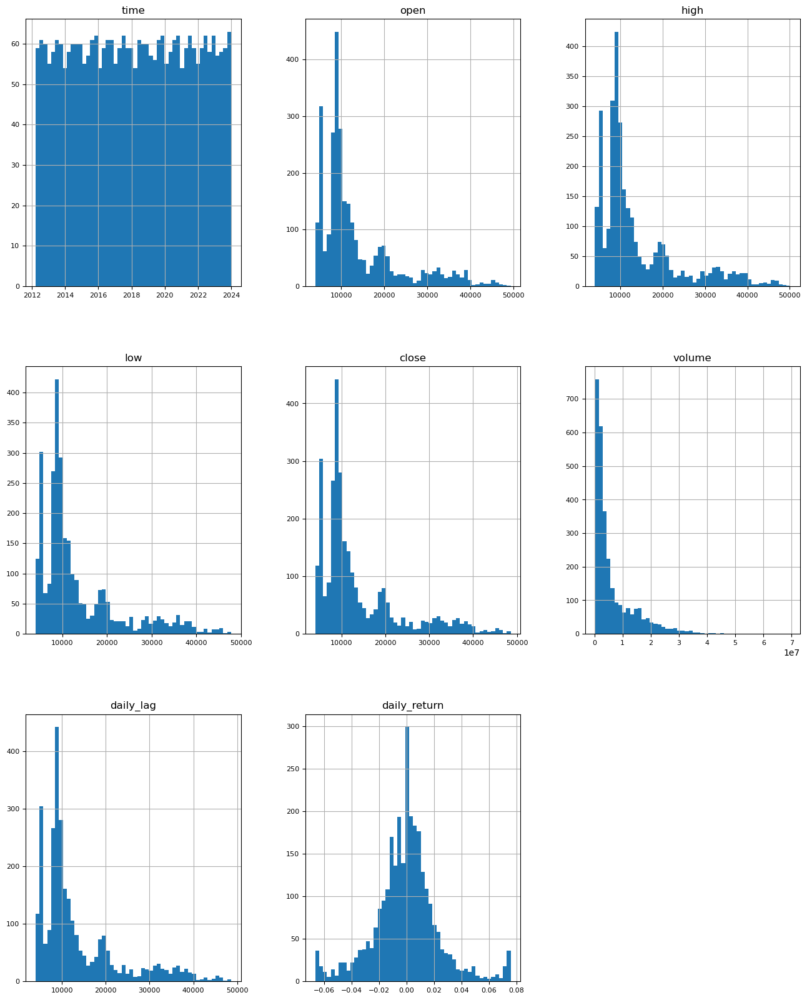

In [ ]:
# Plot the histogram of all numerical column in the dataset
df.hist(figsize=(16,20),bins=50,xlabelsize=8,ylabelsize=8)

**Observation:**
- Looking at the attributes related to price (open, high, low, close) and volume, it shows that their distribution is right skewed. The frequency of prices around VND10,000 is higher than other prices. Prices at higher thresholds such as above VND35,000 have low frequency and the graph also shows that the closing price of SSI stock has never exceeded the VND50,000 mark.
- One remark worth mentioning is that the distribution of 'daily return' closely resembles the normal distribution. The distribution of ‘daily_return’ fluctuates in the range from -0.7 to 0.8, which is consistent with the variation range of the ceiling price and floor price regulated on the Vietnamese stock exchange. The two tails of the distribution chart are suddenly unusually higher than neighboring values, indicating that SSI stock not only excitedly touched the ceiling price many times but also fell to the floor price within a day.

**Correlation**

<AxesSubplot:>

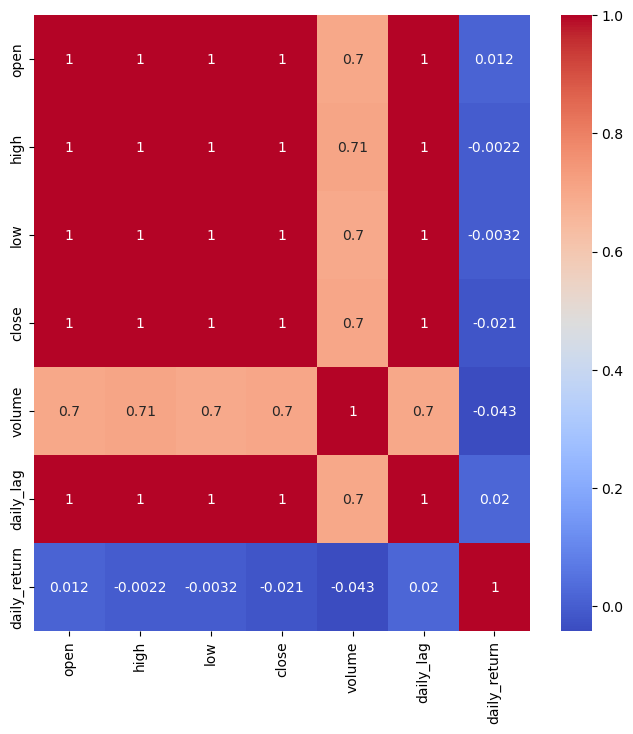

In [ ]:
# Calculates the correlation matrix of the DataFrame 'df' using df.corr(),
# then creates a heatmap plot to visualize correlations between variables.
# 'annot=True' displays correlation values in the heatmap cells,
# 'cmap='coolwarm'' sets the color scheme to represent correlation strength.
import seaborn as sns
import matplotlib.pyplot as plt

corr = df.corr()  # Compute correlation matrix
plt.figure(figsize=(8, 8))  # Set the figure size for the heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm')  # Plot the heatmap


- **Strong Positive Correlations:** The 'open', 'high', 'low', and 'close' columns have strong positive correlations among themselves indicating that these variables are highly positively correlated. This suggests that as one of these variables increases, the others tend to increase as well. This is expected as they are different aspects of stock prices.
- **Volume Correlations:** The 'volume' column has moderate positive correlations with 'open', 'high', 'low', 'close', and 'daily_lag'. This suggests some level of positive association between trading volume and stock prices or previous day's stock prices; indicating some association between trading volume and price movements.
- **Daily Return Correlations:** The 'daily_return' column has very weak correlations with other columns ('open', 'high', 'low', 'close', 'volume', 'daily_lag', 'time'), mostly close to zero or negative, except for a slight positive correlation with 'daily_lag'.
- **Time Correlations:** The 'time' column seems to have moderate positive correlations with the price-related columns ('open', 'high', 'low', 'close'), indicating some level of temporal correlation between time and stock prices.


**Monthly average percentage change**

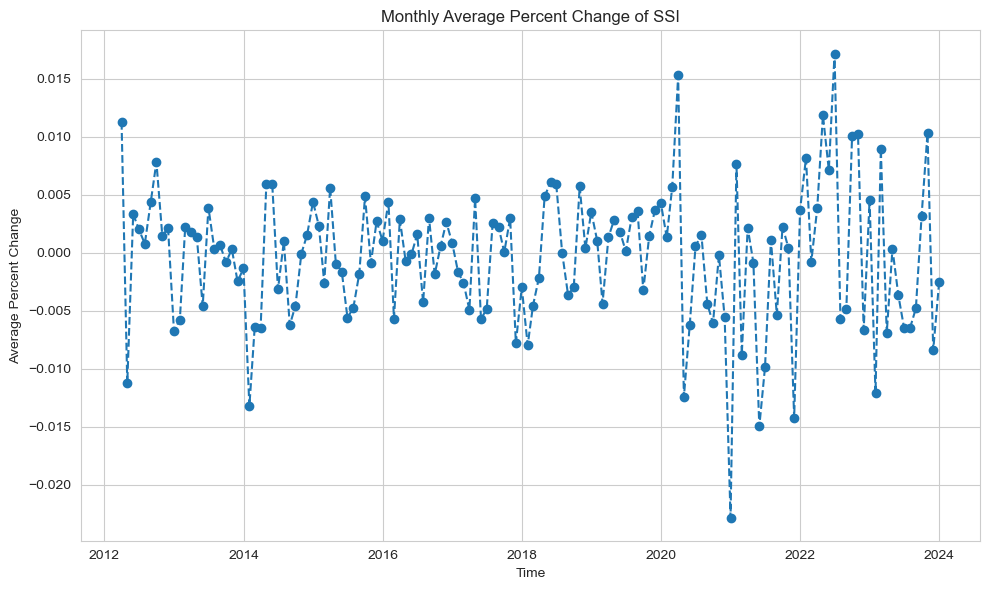

In [ ]:
# Resample the DataFrame 'df' to monthly frequency, calculating the mean percent change for each month
monthly_data = df.set_index('time').resample('M')['daily_return'].mean()

# Plotting the monthly average percent change of the SSI
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))  # Set the figure size for the plot
plt.plot(monthly_data.index, monthly_data.values, marker='o', linestyle='--')  # Plotting the data points
plt.title('Monthly Average Percent Change of SSI')  # Set the plot title
plt.xlabel('Time')  # Label for x-axis
plt.ylabel('Average Percent Change')  # Label for y-axis
plt.grid(True)  # Display grid lines
plt.tight_layout()  # Ensure tight layout

# Display the plot
plt.show()

**Observations:**
- From 'daily_return', it can calculate the monthly average percentage change of SSI stock price. It is clear that before 2020, price fluctuations in a month were quite stable, mostly around -5% to 5%. However, from the beginning of 2020 onwards, price volatility in one month has become more abusive, with the highest profit level being above 15% while the record loss can reach more than 20%.

**Closing Price Over Time**

In [ ]:
# Calculate Moving Averages
df['MA60'] = df['close'].rolling(window=60).mean()
df['MA250'] = df['close'].rolling(window=250).mean()

# Create figure
fig = go.Figure()

# Add Closing Price trace
fig.add_trace(go.Scatter(x=df['time'], y=df['close'], mode='lines', name='Close Price', line=dict(color='blue')))

# Add Volume trace
fig.add_trace(go.Bar(x=df['time'], y=df['volume'], name='Volume', yaxis='y2'))

# Add Moving Averages traces
fig.add_trace(go.Scatter(x=df['time'], y=df['MA60'], mode='lines', name='MA 60', line=dict(color='yellow')))
fig.add_trace(go.Scatter(x=df['time'], y=df['MA250'], mode='lines', name='MA 250', line=dict(color='purple')))

# Get years present in the data
years = pd.to_datetime(df['time']).dt.year.unique()

# Set tick positions and labels for the x-axis
tickvals = df['time'].dt.to_period('Y').unique().to_timestamp()
ticktext = [f"{year}" for year in years]

# Update layout
fig.update_layout(title='SSI - Closing Price, Volume, MA 60, and MA 250',
                  xaxis=dict(title='Time', tickvals=tickvals, ticktext=ticktext),
                  yaxis=dict(title='Price'),
                  yaxis2=dict(title='Volume', overlaying='y', side='right'))

# Show plot
fig.show()

**Observations**:
- The chart showing SSI stock prices over time once again confirms the strong fluctuations of the stock market since 2020. SSI stocks have witnessed a strong increase reaching a peak within two years from 2020 to 2022 Although 2020 was the year of the Covid-19 pandemic and full of difficulties, the stock market witnessed a strong increase. When the economy shows signs of recovery in 2022, stock prices will decrease. This shows that capital flow circulating in the economy does not go hand in hand but precedes economic development. Especially with stocks in the financial sector like SSI, this phenomenon is even more evident.
- A commonly used sign in determining buying and selling points in technical analysis is the moving average (MA). The moving average is a simple technical analysis tool that smooths out price data by creating a constantly updated average price. The average is taken over a specific period of time, like 10 days, 20 minutes, 30 weeks, or any time period the trader chooses. Here the author chooses moving average for 60 days (MA60) and 250 days (MA250) to determine medium and long-term trading signals. Simply put, if the price cuts above the MA60 or MA250 line, it represents a buy signal, and if the price cuts below the MA60 line, it is a sell signal. However, signals often appear very rarely, which causes many investors to miss out on chances.

In [ ]:
# Exponential Smoothing function that computes the smoothed series using the given alpha
def exponential_smoothing(series, alpha):
    result = [series[0]]  # Initialize the result with the first value of the series
    for n in range(1, len(series)):
        # Apply exponential smoothing formula to compute the next value in the result
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

# Function to plot the exponential smoothing for different alpha values
def plot_exponential_smoothing(series, alphas):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(17, 8))  # Set the figure size for the plot
    colors = ['r', 'y', 'b', 'g', 'm']  # Define colors for different alphas

    # Plot the exponential smoothing lines for each alpha along with the actual series
    for i, alpha in enumerate(alphas):
        plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha), color=colors[i])

    plt.plot(series.values, "c", label="Actual")  # Plot the actual series in cyan color
    plt.legend(loc="best")  # Add a legend to the plot
    plt.axis('tight')  # Adjust axis scale to fit the plot
    plt.title("Exponential Smoothing")  # Set the title of the plot
    plt.grid(True)  # Display grid lines


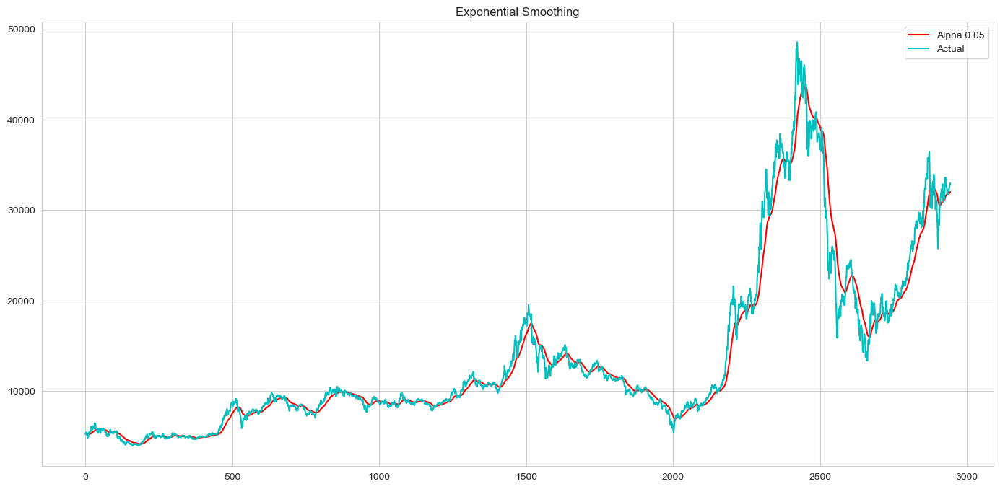

In [ ]:
plot_exponential_smoothing(df['close'], [0.05])

**Candlestick Chart**

In [ ]:
from vnstock.chart import * # import chart functions
fig1 = candlestick_chart(df, ma_periods=[60,250], show_volume=False, reference_period=300, figure_size=(15, 8),
                        title='SSI - Candlestick Chart with MA and Volume', x_label='Date', y_label='Price',
                        colors=('lightgray', 'gray'), reference_colors=('black', 'blue'))

fig1.show()

**Bollinger Bands**

In [ ]:
df = bollinger_bands(df, window=20, num_std_dev=2)
fig2 = bollinger_bands_chart(df, use_candlestick=True, show_volume=True,
                            fig_size=(15, 8), chart_title='SSI - Bollinger Bands Chart', xaxis_title='Date', yaxis_title='Price',
                            bollinger_band_colors=('gray', 'orange', 'gray'), volume_colors=('#00F4B0', '#FF3747'))
fig2.show()

## 3. Traditional Econometric Analysis

**Autoregressive Integrated Moving Average (ARIMA) Model** is one of the most widely used models for predicting time series data. ARIMA is specified by three order parameters (p,d,q):
-	AR (p) Autoregression: An autoregressive (AR(p)) component refers to the use of past values in the regression equation for the time series.
-	I (d) Integration: uses differencing of observations (subtracting an observation with an obseervation from the previous step) in order to make the time series stationary.
-	MA (q) Moving Average: A moving average component depicts the error of the model as a combination of previous error terms. The order q represents the number of terms to be included in the model.


**Set up**

In [ ]:
!pip install pmdarima

!pip install --upgrade tables
import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima.arima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
import time
from sklearn.metrics import r2_score

In [ ]:
# Load the dataset
arima=pd.read_csv('ssi.csv', index_col='time', parse_dates=['time'])
arima.head()

,open,high,low,close,volume
time,,,,,
2012-03-20,5170,5290,5110,5290,2018790
2012-03-21,5350,5560,5320,5380,2955280
2012-03-22,5270,5460,5240,5270,2388550
2012-03-23,5270,5500,5270,5460,2609850
2012-03-26,5500,5500,5380,5380,2511360


**Testing the stationary of the series**

This project uses the Augmented Dickey-Fuller (ADF) Test to verify if the series is stationary or not. The null and alternate hypotheses for the ADF Test are defined as:
-	Null hypothesis: The Time Series is non-stationary.
-	Alternative hypothesis: The Time Series is stationary.

In [ ]:
# Extracting the 'close' column data from the 'arima' DataFrame
df_close = arima['close']

# Augmented Dickey-Fuller test for stationarity
result = adfuller(df_close)  # Applying the ADF test on the 'close' column
print('ADF Statistic: %f' % result[0])  # Displaying the ADF Statistic
print('p-value: %f' % result[1])  # Displaying the p-value
print('Critical Values:')  # Displaying the critical values at different confidence levels
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# Conclusion: The series is not stationary based on the ADF test result

ADF Statistic: -0.977165
p-value: 0.761501
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.567


ADF statistics is bigger than critical values, meaning that we cannot reject the null-hypothesis stating that there is the presence of unit root. So our time-series is unstationary. We should make it stationary first.

**Making the series stationary**

In this project, we use a difference order of 1 to make the time series stationary.

In [ ]:
# get the differences of the observations for stationarity
df_close1 = df_close.diff()
df_close1 # first row should be dropped due to the NaN value

time
2012-03-20      NaN
2012-03-21     90.0
2012-03-22   -110.0
2012-03-23    190.0
2012-03-26    -80.0
              ...  
2023-12-22    150.0
2023-12-25    199.0
2023-12-26    201.0
2023-12-27     50.0
2023-12-28    200.0
Name: close, Length: 2944, dtype: float64

In [ ]:
# drop the NaN row
df_close1.dropna(inplace=True)
df_close1 # now the series one less --> 2943

time
2012-03-21     90.0
2012-03-22   -110.0
2012-03-23    190.0
2012-03-26    -80.0
2012-03-27   -270.0
              ...  
2023-12-22    150.0
2023-12-25    199.0
2023-12-26    201.0
2023-12-27     50.0
2023-12-28    200.0
Name: close, Length: 2943, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

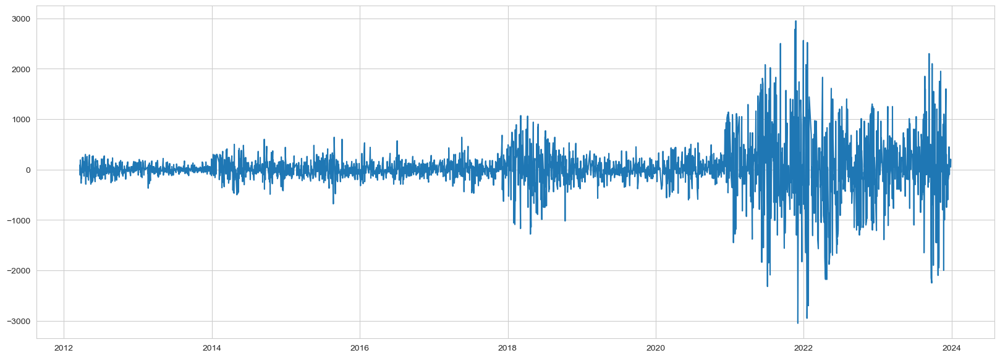

In [ ]:
# plot the series again to observe stationarity
plt.figure(figsize=(20,7))
plt.grid(True)
plt.plot(df_close1)
plt.show

In [ ]:
# check again to see if the series get stationary
result = adfuller(df_close1, regression='ctt')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -9.742292
p-value: 0.000000
Critical Values:
	1%: -4.375
	5%: -3.834
	10%: -3.555


 This time our series got stationary in every confidence level (smaller than all critical values and/or p-value suggest the rejection of the null-hypothesis)

**Building model**

First, we will plot the ACF and PACF plots to get the values of p and q.

(-0.05, 0.05)

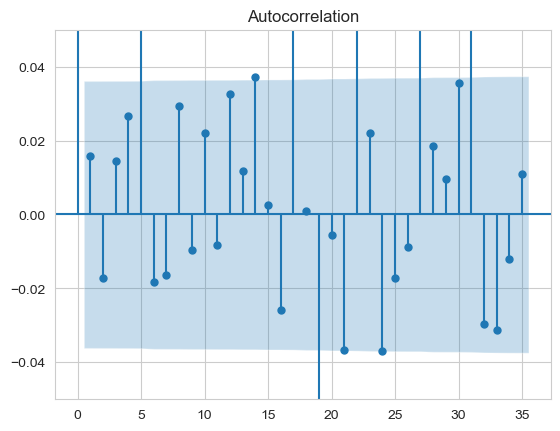

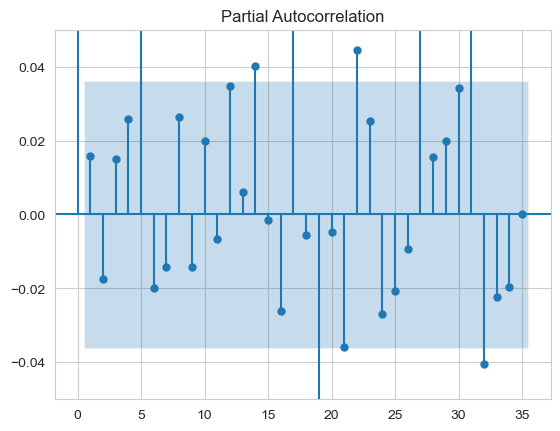

In [ ]:
# plot the autocorrelation and partial autocorrelation
# this tells us about the AR(q) and MA(p) values
acf = plot_acf(df_close1)
plt.ylim(-0.05,0.05)
pacf = plot_pacf(df_close1)
plt.ylim(-0.05,0.05)

From the above PACF plot, we can see that the highest lag at which the plot extends beyond the statistically significant boundary is lag 1. This indicates that an AR Model of lag 1 (p=1) should be sufficient to fit the data. Similarly, from the ACF plot, we can infer that q=1.

Then this project use Auto-ARIMA to determine the values of p,d,q. As the result, the best model is ARIMA (1, 0, 1).

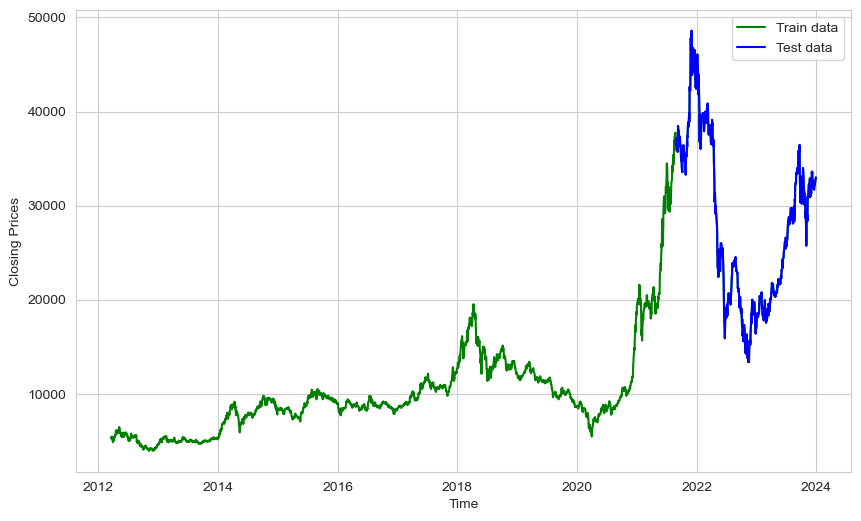

In [ ]:
#split data into train and training set
train_data, test_data = df_close[:int(len(df_close)*0.8)], df_close[int(len(df_close)*0.8):]
plt.figure(figsize=(10,6))
plt.grid(True)
plt.xlabel('Time')
plt.ylabel('Closing Prices')
plt.plot(df_close, 'green', label='Train data')
plt.plot(test_data, 'blue', label='Test data')
plt.legend()

In [ ]:
from pmdarima.arima import auto_arima

# we will set (p,d,q)start = 0 and (p,d,q)max = 2
arima_model = auto_arima(train_data, start_p = 0, d=0, start_q = 0,
                          max_p = 3, max_d=2, max_q = 3,
                          seasonal = False, # there is no seasonality
                          trace = True,
                          test = 'adf', # this will find optimal 'd'
                          error_action ='ignore',
                          suppress_warnings = True,
                          stepwise = True, n_fits=50)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=50634.463, Time=12.17 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.61 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=1.18 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=33438.883, Time=2.86 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=33439.192, Time=3.72 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=33440.102, Time=4.20 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=4.98 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.61 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=33441.217, Time=1.61 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=33440.595, Time=1.85 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 33.867 seconds


In [ ]:
# Modeling
# Build Model
model = ARIMA(train_data, order=(1,0,1))
fitted = model.fit()
print(fitted.summary())

/Users/user/.conda/envs/PythonProject/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/user/.conda/envs/PythonProject/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/user/.conda/envs/PythonProject/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  close   No. Observations:                 2355
Model:                 ARIMA(1, 0, 1)   Log Likelihood              -16716.051
Date:                Mon, 01 Jan 2024   AIC                          33440.102
Time:                        17:46:12   BIC                          33463.159
Sample:                             0   HQIC                         33448.498
                               - 2355                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.008e+04      1.041   9687.857      0.000    1.01e+04    1.01e+04
ar.L1          0.9998      0.000   3588.760      0.000       0.999       1.000
ma.L1         -0.0098      0.008     -1.180      0.2

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
import time

# Record start time of the execution
start = time.time()

# Initialize history with training data
history = [x for x in train_data]
predictions = list()

# Iterate through each data point in the test data
for t in range(len(test_data)):
    # Create ARIMA model using historical data in history
    model = ARIMA(history, order=(1, 0, 1))

    # Fit ARIMA model to historical data
    model_fit = model.fit()

    # Forecast the next value
    output = model_fit.forecast()

    # Retrieve the forecasted value
    yhat = output[0]

    # Append the predicted value to predictions list
    predictions.append(yhat)

    # Get the actual observed value from test_data
    obs = test_data[t]

    # Update history with the observed value for the next iteration
    history.append(obs)

    # Print predicted and expected values for each iteration
    print('Predicted=%f, Expected=%f ' % (yhat, obs))

# Record end time of the execution
end = time.time()

# Calculate and print total execution time
print("Total time:", end - start, "seconds")


Predicted=36458.393555, Expected=36920.000000 
Predicted=36910.104573, Expected=36390.000000 
Predicted=36393.093702, Expected=36450.000000 
Predicted=36444.956906, Expected=37160.000000 
Predicted=37145.887381, Expected=36800.000000 
Predicted=36801.240783, Expected=36450.000000 
Predicted=36451.071592, Expected=35720.000000 
Predicted=35725.459402, Expected=35970.000000 
Predicted=35962.134610, Expected=38470.000000 
Predicted=38437.726084, Expected=38210.000000 
Predicted=38209.165632, Expected=38070.000000 
Predicted=38068.135121, Expected=37900.000000 
Predicted=37898.402901, Expected=36950.000000 
Predicted=36958.110982, Expected=37290.000000 
Predicted=37281.081978, Expected=36950.000000 
Predicted=36950.737371, Expected=37380.000000 
Predicted=37368.984168, Expected=37210.000000 
Predicted=37208.355626, Expected=36600.000000 
Predicted=36605.352172, Expected=36330.000000 
Predicted=36329.817126, Expected=36430.000000 
Predicted=36424.227288, Expected=36330.000000 
Predicted=363

In [ ]:
def calculate_accuracy(real, predict):
    # Add 1 to both 'real' and 'predict' arrays to avoid division by zero
    real = np.array(real) + 1
    predict = np.array(predict) + 1

    # Calculate percentage accuracy based on root mean squared percentage error
    percentage = 1 - np.sqrt(np.mean(np.square((real - predict) / real)))

    # Convert accuracy to percentage and return the result
    return percentage * 100  # Returns the calculated accuracy as a percentage

In [ ]:
# Calculate the accuracy of the model
accuracies = calculate_accuracy(test_data, predictions)
np.mean(accuracies)

96.99156306837531

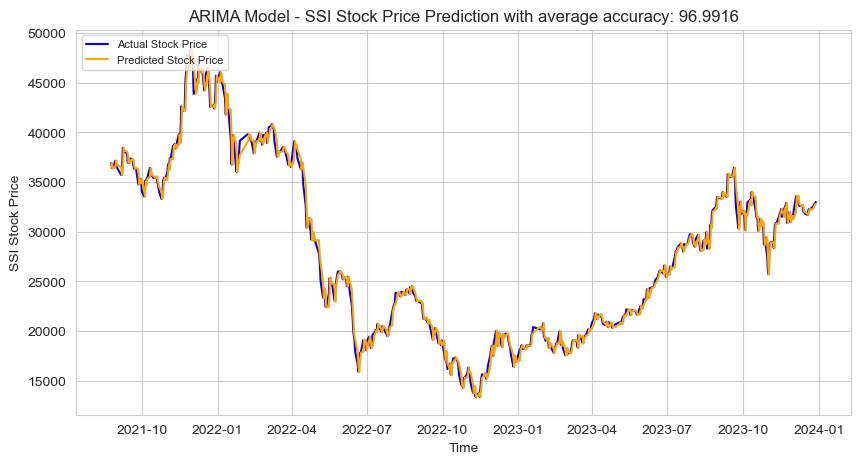

In [ ]:
# Plot the predictions vs actual values
plt.figure(figsize=(10,5), dpi=100)
plt.plot(test_data, color = 'blue', label='Actual Stock Price')
plt.plot(test_data.index, predictions, color = 'orange',label='Predicted Stock Price')
plt.title('ARIMA Model - SSI Stock Price Prediction with average accuracy: %.4f'%(np.mean(accuracies)))
plt.xlabel('Time')
plt.ylabel('SSI Stock Price')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [ ]:
def save_result(test_data, predictions, filename):
    # Convert the lists or arrays to pandas DataFrames
    df_test = pd.DataFrame(test_data, columns=["Test_Data_Column"])  # Replace "Test_Data_Column" with your column name
    df_predictions = pd.DataFrame(predictions, columns=["Predictions_Column"])  # Replace "Predictions_Column" with your column name

    # Concatenate the DataFrames side by side (axis=1)
    result_df = pd.concat([df_test, df_predictions], axis=1)

    # Save the combined DataFrame to a CSV file
    result_df.to_csv(filename, index=False)  # Change the filename to your desired file name

In [ ]:
# Save result
save_result(test_data.values, predictions, 'ARIMA_result.csv')

**Model Evaluation**

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Function to calculate evalution metrics
def calculate_metrics(actual, predicted):
    # Mean Squared Error (MSE)
    mse = mean_squared_error(actual, predicted)

    # Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)

    # Mean Absolute Error (MAE)
    mae = mean_absolute_error(actual, predicted)

    # Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100

    # R-squared (R2)
    r2 = r2_score(actual, predicted)

    return mse, rmse, mae, mape, r2


In [ ]:
# Calculate evaluation metrics
mse, rmse, mae, mape, r2 = calculate_metrics(test_data.values, predictions)

print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"MAPE: {mape}")
print(f"R-squared: {r2}")


MSE: 667859.1311193334
RMSE: 817.2264870397516
MAE: 592.6505797357868
MAPE: 2.2202997801949347
R-squared: 0.9912094594072957


Overall, the ARIMA model demonstrates strong performance across multiple metrics. The low values for MSE, RMSE, MAE, and MAPE, along with the high R-squared value, indicate that the model provides accurate predictions and effectively captures patterns in the data.

## 4. AI Models Analysis

In this project, we employ 3 AI models, which are long short-term memory (LSTM), Gated Recurrent Unit (GRU) and transformer model.  In which, both GRU and LSTM belong to traditional recurrent neural networks suitable for sequential data like stock prices. For Transformer, although originally designed for natural language processing, it is also applicable to sequential data and efficiently captures dependencies across the entire sequence length due to its self-attention mechanism to understand long-term patterns. Also, the parallel processing capability can facilitate for faster training, especially with large datasets.

**Steps in prediction stock prices using AI models**
1. Importing packages and data
2. Preparing Training (80%) and Testing (20%) set
3. Choosing the timesteps
- It is worth mentioning that the choice of the number of timesteps is important in both recurrent neutral networks or transformers. For recurrent neutral networks, the optimum is usually between 40-90 timesteps. but for the transformers the optimum choice is often much lower, with usually under 10. In this project, we create a data structure with 60 timesteps for LSTM and GRU, and 8 timesteps for the transformer model.
4. Preprocessing Data:
- To facilitate this step I have create this def function to feature scaling, data reshaping and preparing training and testing data based on the length of the time_steps by sliding the window technique. In the simple words, the testing dataset needs to include the last 60 values of the training dataset to get the prediction from the 1st column of the testing dataset.
5. Building and Training model
- Training Strategy: To avoid overfitting, our project have a training strategy which is setting the Learning Rate Scheduler. This learning rate scheduler has a warm-up phase followed by a linear decay phase. This helps in stabilizing the training process at the beginning and gradually reducing the learning rate to refine the model. Second, we use EarlyStopping callbacks for stopping training when the model's performance on a validation set is not improved.
6. Testing and Evaluating model performance
- Reverse sclaing the results and compare the prediction and actual values.
- Metrics: Accuracy, MSE, RMSE, MAE, MAPE and R-squared.

### a. Long Short Term Memory (LSTM) Model

**Set up**

In [ ]:
# Import necessary packages
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter('ignore')

!pip install tensorflow
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib. pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from keras.layers import *
from keras.callbacks import EarlyStopping

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit

import tensorflow as tf
from tensorflow.keras.optimizers import Adam


2024-01-01 10:25:21.350659: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
# Load the dataset
data=pd.read_csv('ssi.csv', index_col= 'time', parse_dates=['time'])
data.head()

,open,high,low,close,volume
time,,,,,
2012-03-20,5170,5290,5110,5290,2018790
2012-03-21,5350,5560,5320,5380,2955280
2012-03-22,5270,5460,5240,5270,2388550
2012-03-23,5270,5500,5270,5460,2609850
2012-03-26,5500,5500,5380,5380,2511360


**Helpful functions**

In [ ]:
# Function for model evaluation and plotting SSI stock prices (real and predicted)
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def model_evaluation(test, predicted, model_name):
    # Function to calculate accuracy
    def calculate_accuracy(real, predict):
        real = np.array(real) + 1
        predict = np.array(predict) + 1
        percentage = 1 - np.sqrt(np.mean(np.square((real - predict) / real)))
        return percentage * 100

    # Calculate accuracy
    accuracy = calculate_accuracy(test, predicted)

    # Plotting the real and predicted SSI stock prices
    plt.plot(test, color="red", label="Real SSI stock price")
    plt.plot(predicted, color="blue", label="Predicted stock price")
    plt.title(f"{model_name} - SSI Stock Price Prediction\nAverage Accuracy: {np.mean(accuracy):.2f}%")
    plt.xlabel("Time")
    plt.ylabel("SSI Stock Price")
    plt.legend()
    plt.show()

    # Function to calculate evaluation metrics
    def calculate_metrics(actual, predicted):
        # Mean Squared Error (MSE)
        mse = mean_squared_error(actual, predicted)
        # Root Mean Squared Error (RMSE)
        rmse = np.sqrt(mse)
        # Mean Absolute Error (MAE)
        mae = mean_absolute_error(actual, predicted)
        # Mean Absolute Percentage Error (MAPE)
        mape = np.mean(np.abs((actual - predicted) / actual)) * 100
        # R-squared (R2)
        r2 = r2_score(actual, predicted)
        return mse, rmse, mae, mape, r2

    # Calculate evaluation metrics
    mse, rmse, mae, mape, r2 = calculate_metrics(test, predicted)

    # Print evaluation metrics
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAE: {mae}")
    print(f"MAPE: {mape}")
    print(f"R-squared: {r2}")


In [ ]:
def calculate_accuracy(real, predict):
    # Add 1 to both 'real' and 'predict' arrays to avoid division by zero
    real = np.array(real) + 1
    predict = np.array(predict) + 1

    # Calculate percentage accuracy based on root mean squared percentage error
    percentage = 1 - np.sqrt(np.mean(np.square((real - predict) / real)))

    # Convert accuracy to percentage and return the result
    return percentage * 100  # Returns the calculated accuracy as a percentage


In [ ]:
def plot_loss_curve(history):
    # Extracting loss and validation loss from training history
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Generating range of epochs
    epochs = range(1, len(loss) + 1)

    # Plotting training and validation loss curves
    plt.plot(epochs, loss, 'y', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

**Spliting the dataset into training (80%) and testing (20%) set**

In [ ]:
# Splitting the data into training and test sets based on a specified train_size
train_size = 0.8  # Percentage of data for training

# Extracting the first 'train_size' percentage of data for training
train = pd.DataFrame(data['close'][0:int(len(data['close']) * train_size)])

# Extracting the remaining data for testing
test = pd.DataFrame(data['close'][int(len(data['close']) * train_size):])

**Data preprocessing**

In [ ]:
# Function to preprocessing data to create training and testing dataset
def prepare_data(close, time_steps=60):
    # Initialize a MinMaxScaler to scale data between 0 and 1
    sc = MinMaxScaler(feature_range=(0, 1))

    # Scale the 'train' dataset using the MinMaxScaler
    train_scaled = sc.fit_transform(train)

    # Prepare x_train and y_train by creating sequences of 'time_steps' length
    x_train = []
    y_train = []
    for i in range(time_steps, train_scaled.shape[0]):
        x_train.append(train_scaled[i - time_steps:i, 0])
        y_train.append(train_scaled[i, 0])

    # Convert x_train and y_train to numpy arrays and reshape x_train for LSTM input
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Prepare test data for prediction by transforming and reshaping the 'close' data
    dataset_total = close
    inputs = dataset_total[len(dataset_total) - len(test) - time_steps:].values
    inputs = inputs.reshape(-1, 1)
    inputs = sc.transform(inputs)

    # Create x_test by creating sequences for test data similar to x_train
    x_test = []
    for i in range(time_steps, inputs.shape[0]):
        x_test.append(inputs[i - time_steps:i, 0])

    # Convert x_test to a numpy array and reshape it for LSTM input
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Scale the test dataset using the MinMaxScaler
    y_test = sc.transform(test)

    return x_train, y_train, x_test, y_test, sc

In [ ]:
# Create training and testing dataset
x_train, y_train, x_test, y_test, sc = prepare_data(data['close'])  # Adjust parameters as needed
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape, train.shape, test.shape)

(2295, 60, 1) (2295,) (589, 60, 1) (589, 1) (2355, 1) (589, 1)


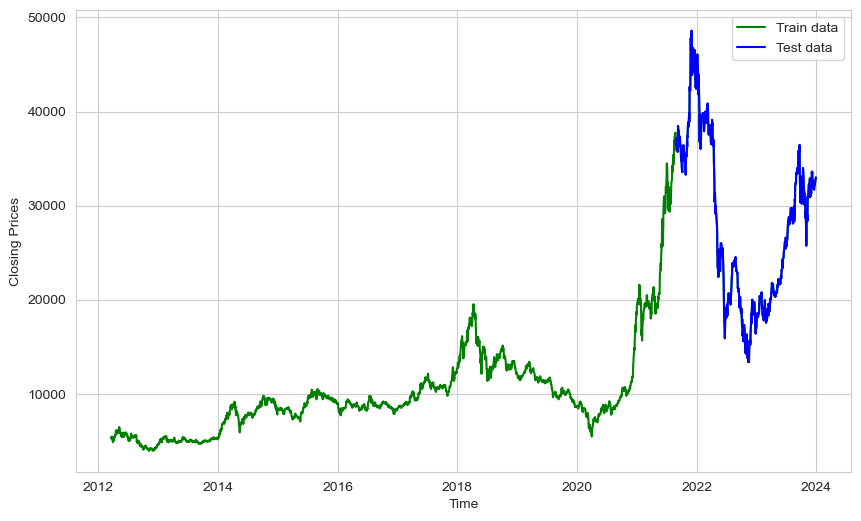

In [ ]:
# Plot the training and testing data
plt.figure(figsize=(10,6))
plt.grid(True)
plt.xlabel('Time')
plt.ylabel('Closing Prices')
plt.plot(data['close'], 'green', label='Train data')
plt.plot(test, 'blue', label='Test data')
plt.legend()

**Building LSTM Models**

In [ ]:
# Function to create Learning Rate Scheduler
def lr_scheduler(epoch, lr, warmup_epochs=30, decay_epochs=100, initial_lr=1e-6, base_lr=1e-3, min_lr=5e-5):
    # Learning rate scheduler function that adjusts learning rate based on epoch

    # If the epoch is less than or equal to the warmup_epochs, linearly increase the learning rate
    if epoch <= warmup_epochs:
        pct = epoch / warmup_epochs
        return ((base_lr - initial_lr) * pct) + initial_lr

    # If the epoch is between warmup_epochs and warmup_epochs + decay_epochs, linearly decrease the learning rate
    if epoch > warmup_epochs and epoch < warmup_epochs + decay_epochs:
        pct = 1 - ((epoch - warmup_epochs) / decay_epochs)
        return ((base_lr - min_lr) * pct) + min_lr

    # Return the minimum learning rate for epochs beyond warmup_epochs + decay_epochs
    return min_lr

from tensorflow import keras

# Define callbacks for the model training including EarlyStopping and LearningRateScheduler
callbacks = [
    keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
    keras.callbacks.LearningRateScheduler(lr_scheduler)
]

**Same Architectured Layer LSTM**

This model architecture is a sequential neural network composed of multiple same LSTM layers followed by dropout layers and a single dense output unit.

- LSTM Layers: The two LSTM layers with 50 units each are suitable for capturing temporal dependencies in sequential data. The return_sequences=True in the first LSTM layer implies that it outputs sequences to the subsequent layer.

- Dropout: Dropout layers (with a rate of 0.2) are included after each LSTM layer. Dropout helps prevent overfitting by randomly deactivating a fraction of neurons during training.

- Dense Output Layer: The model ends with a dense output layer with one unit, which is appropriate for regression tasks where the goal is to predict a continuous variable.

- Compilation: The model is compiled using the Adam optimizer with a mean squared error loss function, which is suitable for regression problems. Additionally, mean absolute error is used as a metric to evaluate model performance.

- Training Configuration: The model is trained for 50 epochs with a batch size of 64 and a validation split of 20%. The choice of callbacks have an impact on training, enabling techniques including learning rate schedule, early stopping to stop when the model performance on the validation set is not improved.

In [ ]:
# The 2-same-layer LSTM
def basic1():
    # Initialize a sequential model
    model = Sequential()

    # Add the first LSTM layer with 50 units, input shape, and return sequences
    model.add(LSTM(units=50, return_sequences=True, input_shape=(x_train.shape[1],1)))
    # Add dropout to prevent overfitting
    model.add(Dropout(0.2))

    # Add a second LSTM layer with 50 units
    model.add(LSTM(units=50))
    # Add dropout to prevent overfitting
    model.add(Dropout(0.2))

    # Add a dense output layer with one unit
    model.add(Dense(units=1))

    # compiling the LSTM RNN network
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])

    # fit to the training set
    history = model.fit(x_train, y_train, validation_split=0.2, epochs=50, batch_size=64, callbacks=callbacks)

    #plot the training and validation accuracy and loss at each epoch
    plot_loss_curve(history)

    return model

Epoch 1/50
29/29 [==============================] - 20s 164ms/step - loss: 0.0325 - mean_absolute_error: 0.1546 - val_loss: 0.1629 - val_mean_absolute_error: 0.3161 - lr: 1.0000e-06
Epoch 2/50
29/29 [==============================] - 3s 111ms/step - loss: 0.0261 - mean_absolute_error: 0.1361 - val_loss: 0.1170 - val_mean_absolute_error: 0.2603 - lr: 3.4300e-05
Epoch 3/50
29/29 [==============================] - 3s 119ms/step - loss: 0.0123 - mean_absolute_error: 0.0882 - val_loss: 0.0485 - val_mean_absolute_error: 0.1492 - lr: 6.7600e-05
Epoch 4/50
29/29 [==============================] - 3s 113ms/step - loss: 0.0028 - mean_absolute_error: 0.0411 - val_loss: 0.0139 - val_mean_absolute_error: 0.0762 - lr: 1.0090e-04
Epoch 5/50
29/29 [==============================] - 3s 119ms/step - loss: 0.0018 - mean_absolute_error: 0.0331 - val_loss: 0.0121 - val_mean_absolute_error: 0.0688 - lr: 1.3420e-04
Epoch 6/50
29/29 [==============================] - 4s 126ms/step - loss: 0.0013 - mean_absolu

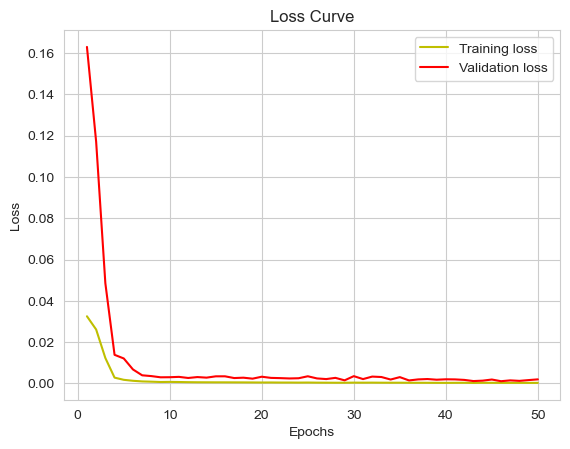

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_19 (LSTM)              (None, 60, 50)            10400     
                                                                 
 dropout_19 (Dropout)        (None, 60, 50)            0         
                                                                 
 lstm_20 (LSTM)              (None, 50)                20200     
                                                                 
 dropout_20 (Dropout)        (None, 50)                0         
                                                                 
 dense_8 (Dense)             (None, 1)                 51        
                                                                 
Total params: 30651 (119.73 KB)
Trainable params: 30651 (119.73 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Training model
model.reset_states() #this is only if running the model again
model = basic1()
model.summary()

In [ ]:
# Use the trained model to predict stock prices for the test set
predicted = model.predict(x_test)

# Inverse transform the predicted values to their original scale
predicted = sc.inverse_transform(predicted)

19/19 [==============================] - 6s 24ms/step


In [ ]:
# Calculate average accuracy of the model
np.mean(calculate_accuracy(test.values, predicted))

90.35339837123809

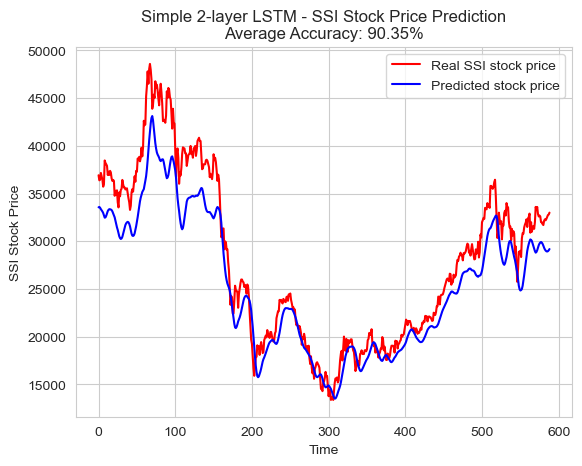

MSE: 10394602.693731029
RMSE: 3224.0661739069546
MAE: 2589.034594187712
MAPE: 8.471653901722211
R-squared: 0.8631834579080576


In [ ]:
# visualizing the results: predicted vs test and metrics to evaluate model
model_evaluation(test.values, predicted, 'Simple 2-layer LSTM')

In [ ]:
#The 3-same-layer LSTM
def basic2():
    # Initialize a sequential model
    model = Sequential()

    # Add the first LSTM layer with 50 units, input shape, and return sequences
    model.add(LSTM(units=50, return_sequences=True, input_shape=(x_train.shape[1],1)))
    # Add dropout to prevent overfitting
    model.add(Dropout(0.2))

    # Add a second LSTM layer with 50 units and return sequences
    model.add(LSTM(units=50, return_sequences=True))
    # Add dropout to prevent overfitting
    model.add(Dropout(0.2))

    # Add a third LSTM layer with 50 units
    model.add(LSTM(units=50))
    # Add dropout to prevent overfitting
    model.add(Dropout(0.2))

    # Add a dense output layer with one unit
    model.add(Dense(units=1))

    # compiling the LSTM RNN network
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])

    # fit to the training set
    history = model.fit(x_train, y_train, validation_split=0.2, epochs=50, batch_size=64, callbacks=callbacks)

    #plot the training and validation accuracy and loss at each epoch
    plot_loss_curve(history)

    return model

Epoch 1/50
29/29 [==============================] - 39s 531ms/step - loss: 0.0311 - mean_absolute_error: 0.1513 - val_loss: 0.1573 - val_mean_absolute_error: 0.3102 - lr: 1.0000e-06
Epoch 2/50
29/29 [==============================] - 5s 184ms/step - loss: 0.0237 - mean_absolute_error: 0.1288 - val_loss: 0.1060 - val_mean_absolute_error: 0.2424 - lr: 3.4300e-05
Epoch 3/50
29/29 [==============================] - 6s 200ms/step - loss: 0.0073 - mean_absolute_error: 0.0655 - val_loss: 0.0249 - val_mean_absolute_error: 0.1018 - lr: 6.7600e-05
Epoch 4/50
29/29 [==============================] - 6s 199ms/step - loss: 0.0026 - mean_absolute_error: 0.0407 - val_loss: 0.0207 - val_mean_absolute_error: 0.0906 - lr: 1.0090e-04
Epoch 5/50
29/29 [==============================] - 6s 200ms/step - loss: 0.0016 - mean_absolute_error: 0.0311 - val_loss: 0.0105 - val_mean_absolute_error: 0.0648 - lr: 1.3420e-04
Epoch 6/50
29/29 [==============================] - 6s 204ms/step - loss: 0.0011 - mean_absolu

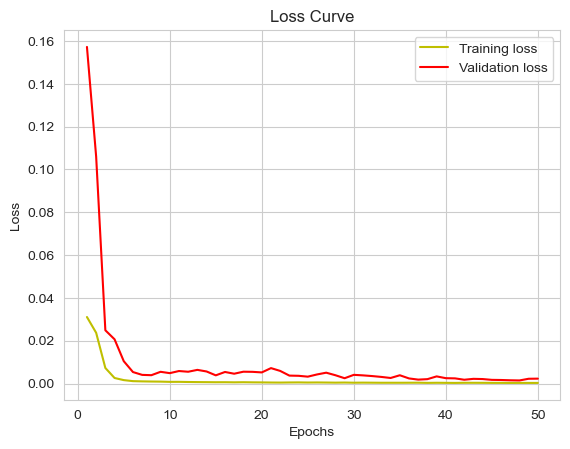

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 60, 50)            10400     
                                                                 
 dropout_6 (Dropout)         (None, 60, 50)            0         
                                                                 
 lstm_7 (LSTM)               (None, 60, 50)            20200     
                                                                 
 dropout_7 (Dropout)         (None, 60, 50)            0         
                                                                 
 lstm_8 (LSTM)               (None, 50)                20200     
                                                                 
 dropout_8 (Dropout)         (None, 50)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                

In [ ]:
# Model training
model.reset_states() #this is only if running the model again
model = basic2()
model.summary()

In [ ]:
# Use the trained model to predict stock prices for the test set
predicted = model.predict(x_test)

# Inverse transform the predicted values to their original scale
predicted = sc.inverse_transform(predicted)

19/19 [==============================] - 3s 34ms/step


In [ ]:
# Calculate average accuracy of the model
np.mean(calculate_accuracy(test.values, predicted))

89.93809598967573

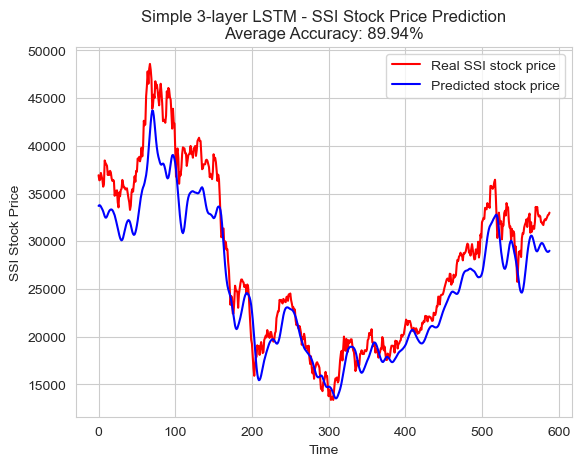

MSE: 10789005.308183836
RMSE: 3284.662129988994
MAE: 2637.783332449066
MAPE: 8.751143441873237
R-squared: 0.8579922251605089


In [ ]:
# visualizing the results: predicted vs test and metrics to evaluate model
model_evaluation(test.values, predicted, 'Simple 3-layer LSTM')

**Observations:**
The result of 2-layer and 3-layer LSTM shows that the increase in layer of this this same achitectured layer LSTM model does not improve the prediction accuracy.

**Different Architectured Layer LSTM**

This model architecture follows a sequential structure with two LSTM layers of different sizes followed by dropout layers and a dense output layer.

- LSTM Layers:
- - The first LSTM layer consists of 128 units and returns sequences (return_sequences=True). It's followed by dropout (20%) and batch normalization, which can help in training stability by normalizing the output of the previous layer.
- - The second LSTM layer has 64 units and does not return sequences (return_sequences=False). It's followed by a higher dropout rate (50%).

- Output Layer: A single-unit dense layer (output layer) is added without any activation function explicitly specified. For regression tasks (as indicated by using mean absolute error as the loss), a linear activation function is typically used by default.

- Compilation and Training: The model is compiled using mean absolute error as the loss function and the Adam optimizer. Mean absolute error is a suitable metric for regression problems.

- Training configuration involves 50 epochs, a batch size of 64, and a validation split of 20%. Callbacks are used, presumably for tasks like early stopping and learning rate schedule.

In [ ]:
# The 2-different-layer LSTM
def lstm():
    # Build the LSTM model
    model = Sequential()

    # First LSTM layer with return sequences
    model.add(LSTM(units=128, input_shape=(x_train.shape[1], 1), return_sequences=True))
    model.add(Dropout(0.2))
    model.add(BatchNormalization())

    # Second LSTM layer
    model.add(LSTM(units=64, return_sequences=False))
    model.add(Dropout(0.5))

    # Output layer
    model.add(Dense(1))

    # Compiling the model with specific loss and optimizer settings
    model.compile(loss='mean_absolute_error', optimizer='adam', metrics=[tf.keras.metrics.MeanAbsoluteError()])

    # Fitting the model on training data with callbacks for early stopping
    history = model.fit(x_train, y_train, validation_split=0.2, epochs=50, batch_size=64, callbacks=callbacks)

    # Plotting the loss curve based on the training history
    plot_loss_curve(history)

    return model

Epoch 1/50
29/29 [==============================] - 16s 309ms/step - loss: 0.1953 - mean_absolute_error: 0.1953 - val_loss: 0.3019 - val_mean_absolute_error: 0.3019 - lr: 1.0000e-06
Epoch 2/50
29/29 [==============================] - 8s 262ms/step - loss: 0.1692 - mean_absolute_error: 0.1692 - val_loss: 0.2671 - val_mean_absolute_error: 0.2671 - lr: 3.4300e-05
Epoch 3/50
29/29 [==============================] - 7s 238ms/step - loss: 0.1313 - mean_absolute_error: 0.1313 - val_loss: 0.2415 - val_mean_absolute_error: 0.2415 - lr: 6.7600e-05
Epoch 4/50
29/29 [==============================] - 7s 248ms/step - loss: 0.0997 - mean_absolute_error: 0.0997 - val_loss: 0.2318 - val_mean_absolute_error: 0.2318 - lr: 1.0090e-04
Epoch 5/50
29/29 [==============================] - 8s 268ms/step - loss: 0.0778 - mean_absolute_error: 0.0778 - val_loss: 0.2234 - val_mean_absolute_error: 0.2234 - lr: 1.3420e-04
Epoch 6/50
29/29 [==============================] - 7s 241ms/step - loss: 0.0614 - mean_absolu

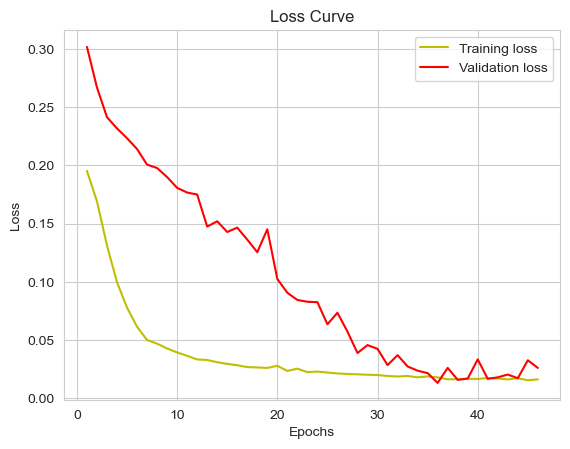

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_33 (LSTM)              (None, 60, 128)           66560     
                                                                 
 dropout_33 (Dropout)        (None, 60, 128)           0         
                                                                 
 batch_normalization_6 (Bat  (None, 60, 128)           512       
 chNormalization)                                                
                                                                 
 lstm_34 (LSTM)              (None, 64)                49408     
                                                                 
 dropout_34 (Dropout)        (None, 64)                0         
                                                                 
 dense_15 (Dense)            (None, 1)                 65        
                                                     

In [ ]:
model.reset_states() #this is only if running the model again
model = lstm()
model.summary()

In [ ]:
# Use the trained model to predict stock prices for the test set
predicted = model.predict(x_test)

# Inverse transform the predicted values to their original scale
predicted = sc.inverse_transform(predicted)

19/19 [==============================] - 3s 57ms/step


In [ ]:
# Calculate accuracy
np.mean(calculate_accuracy(test.values, predicted))

95.41664979545894

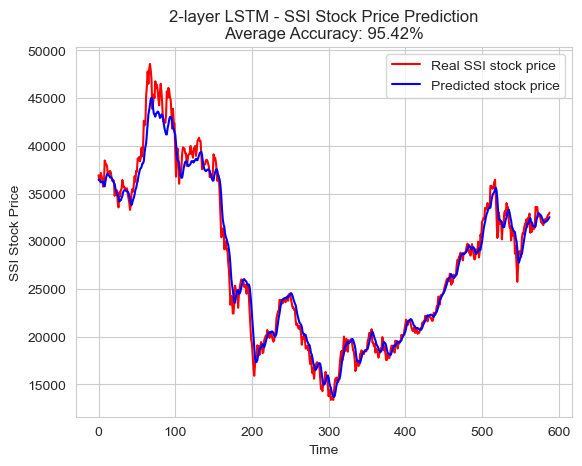

MSE: 1628088.7076619202
RMSE: 1275.9657940798884
MAE: 904.0445952488328
MAPE: 3.2959591731350186
R-squared: 0.978570660778061


In [ ]:
# visualizing the results: predicted vs test and metrics to evaluate model
model_evaluation(test.values, predicted, '2-layer LSTM')

This model architecture is quite deep, consisting of four LSTM layers with increasing units, each followed by a dropout layer.

- LSTM Layers:
- - Layer-wise Complexity: The architecture increases the number of units from 50 to 120 across the LSTM layers. This incrementally complex architecture might allow the model to capture intricate temporal patterns in the data.
- - Activation: ReLU activation functions are used for all LSTM layers. ReLU is known for addressing the vanishing gradient problem and enabling faster convergence in deep networks.

- Dropout Layers: Dropout layers are added after each LSTM layer with increasing dropout rates (from 0.2 to 0.5). Dropout helps in preventing overfitting by randomly dropping connections between layers during training.

- Output Layer: A single-unit dense layer is added as the output layer without specifying an activation function. For regression tasks (using mean squared error as the loss), a linear activation function is typically employed by default.

- Compilation and Training: The model is compiled using the Adam optimizer and mean squared error as the loss function, which is suitable for regression tasks.

- Training configuration involves 50 epochs, a batch size of 64, and a validation split of 20%. Callbacks (named callbacks) are used, likely for tasks like early stopping and learning rate schedule.

In [ ]:
# The 4-different-layer LSTM
def dif_lstm():
    # Initialize a sequential model
    model = Sequential()

    # Adding LSTM layers with increasing units and dropout rates

    # First LSTM layer with 50 units, using ReLU activation function, and returning sequences
    model.add(LSTM(units=50, activation='relu', return_sequences=True, input_shape=(x_train.shape[1], 1)))
    model.add(Dropout(0.2))  # Dropout layer to prevent overfitting

    # Second LSTM layer with 60 units, ReLU activation, and returning sequences
    model.add(LSTM(units=60, activation='relu', return_sequences=True))
    model.add(Dropout(0.3))  # Dropout layer to prevent overfitting

    # Third LSTM layer with 80 units, ReLU activation, and returning sequences
    model.add(LSTM(units=80, activation='relu', return_sequences=True))
    model.add(Dropout(0.4))  # Dropout layer to prevent overfitting

    # Fourth LSTM layer with 120 units, ReLU activation (no return_sequences for the last LSTM layer)
    model.add(LSTM(units=120, activation='relu'))
    model.add(Dropout(0.5))  # Dropout layer to prevent overfitting

    # Adding a Dense output layer
    model.add(Dense(units=1))  # Single unit output

    # Compiling the model with Adam optimizer and mean squared error loss
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])

    # Fitting the model on training data with callbacks for early stopping
    history = model.fit(x_train, y_train, validation_split=0.2, epochs=50, batch_size=64, callbacks=callbacks)

    # Plotting the loss curve based on the training history
    plot_loss_curve(history)

    return model

Epoch 1/50
29/29 [==============================] - 29s 424ms/step - loss: 0.0315 - mean_absolute_error: 0.1528 - val_loss: 0.1571 - val_mean_absolute_error: 0.3115 - lr: 1.0000e-06
Epoch 2/50
29/29 [==============================] - 11s 370ms/step - loss: 0.0299 - mean_absolute_error: 0.1476 - val_loss: 0.1486 - val_mean_absolute_error: 0.2985 - lr: 3.4300e-05
Epoch 3/50
29/29 [==============================] - 11s 381ms/step - loss: 0.0217 - mean_absolute_error: 0.1213 - val_loss: 0.1061 - val_mean_absolute_error: 0.2287 - lr: 6.7600e-05
Epoch 4/50
29/29 [==============================] - 11s 383ms/step - loss: 0.0077 - mean_absolute_error: 0.0701 - val_loss: 0.0575 - val_mean_absolute_error: 0.1512 - lr: 1.0090e-04
Epoch 5/50
29/29 [==============================] - 11s 379ms/step - loss: 0.0039 - mean_absolute_error: 0.0492 - val_loss: 0.0134 - val_mean_absolute_error: 0.0752 - lr: 1.3420e-04
Epoch 6/50
29/29 [==============================] - 11s 377ms/step - loss: 0.0018 - mean_a

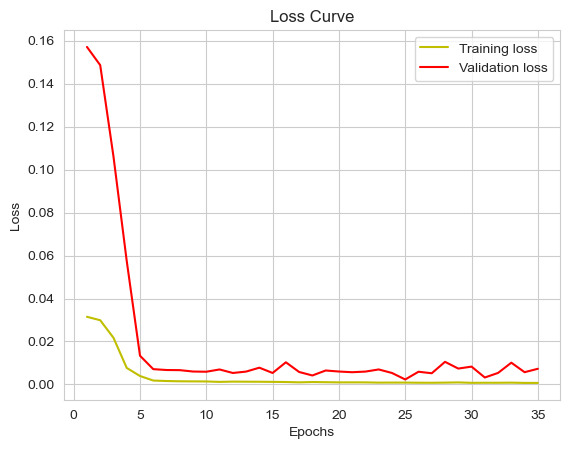

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_35 (LSTM)              (None, 60, 50)            10400     
                                                                 
 dropout_35 (Dropout)        (None, 60, 50)            0         
                                                                 
 lstm_36 (LSTM)              (None, 60, 60)            26640     
                                                                 
 dropout_36 (Dropout)        (None, 60, 60)            0         
                                                                 
 lstm_37 (LSTM)              (None, 60, 80)            45120     
                                                                 
 dropout_37 (Dropout)        (None, 60, 80)            0         
                                                                 
 lstm_38 (LSTM)              (None, 120)             

In [ ]:
model.reset_states() #this is only if running the model again
model = dif_lstm()
model.summary()

In [ ]:
# Use the trained model to predict stock prices for the test set
predicted = model.predict(x_test)

# Inverse transform the predicted values to their original scale
predicted = sc.inverse_transform(predicted)

19/19 [==============================] - 3s 79ms/step


In [ ]:
# Calculate accuracy
np.mean(calculate_accuracy(test.values, predicted))

90.71155768171278

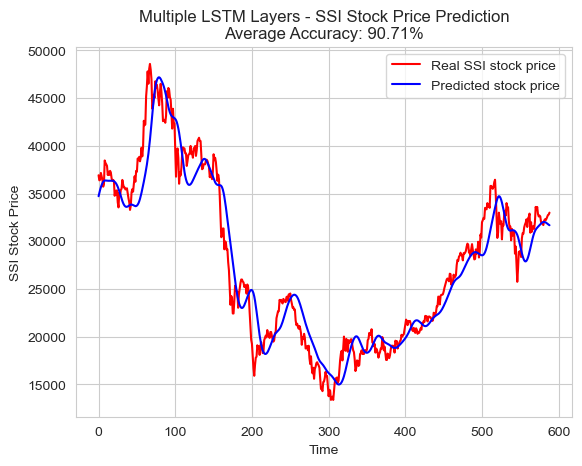

MSE: 5716696.282524593
RMSE: 2390.961372026866
MAE: 1825.9987979493847
MAPE: 6.9299521740879015
R-squared: 0.9247553138287254


In [ ]:
# visualizing the results: predicted vs test and metrics to evaluate model
model_evaluation(test.values, predicted, 'Multiple LSTM Layers')

**Observations:**
- An increase in layers do not lead to increase in model performance.
- Different architectured layer LSTM shows better prediction accuracy and the same architectured layer LSTM.

**Bidirectional LSTM**

This model architecture uses a Bidirectional LSTM layer followed by two dense layers for regression.

- Bidirectional LSTM Layer: The model starts with a Bidirectional LSTM layer with 128 units. Bidirectional LSTMs process the input sequence not only in the forward direction but also in the reverse, potentially capturing more context from the input data.

- Dense Layers: After the Bidirectional LSTM layer, there's a Dense layer with 64 units followed by another Dense layer serving as the output layer with a single unit. The absence of an activation function in these layers implies a linear activation by default.

- Compilation and Training: The model is compiled using the Adam optimizer and mean squared error as the loss function, suitable for regression tasks.

- Training configuration includes 100 epochs, a batch size of 32, and a validation split of 20%. There are callbacks (named callbacks) used, likely for tasks like early stopping or learning rate schedule.

In [ ]:
# The bidirectional LSTM
def bidirectional_lstm():
    # Initialize a Sequential model
    model = Sequential()

    # Add a Bidirectional LSTM layer with 128 units
    model.add(Bidirectional(LSTM(units=128), input_shape=(x_train.shape[1], 1)))

    # Add a Dense layer with 64 units
    model.add(Dense(64))

    # Add another Dense layer for the output (single unit)
    model.add(Dense(units=1))

    # Compile the model with Adam optimizer and mean squared error loss
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])

    # Train the model on the provided data with validation split, epochs, batch size, and callbacks
    history = model.fit(x_train, y_train, validation_split=0.2, epochs=100, batch_size=32, callbacks=callbacks)

    # Plot the loss curve based on training history
    plot_loss_curve(history)

    return model

Epoch 1/100
58/58 [==============================] - 35s 249ms/step - loss: 0.0203 - mean_absolute_error: 0.1219 - val_loss: 0.1070 - val_mean_absolute_error: 0.2537 - lr: 1.0000e-06
Epoch 2/100
58/58 [==============================] - 10s 165ms/step - loss: 0.0068 - mean_absolute_error: 0.0612 - val_loss: 0.0190 - val_mean_absolute_error: 0.0896 - lr: 3.4300e-05
Epoch 3/100
58/58 [==============================] - 10s 169ms/step - loss: 0.0010 - mean_absolute_error: 0.0245 - val_loss: 0.0116 - val_mean_absolute_error: 0.0709 - lr: 6.7600e-05
Epoch 4/100
58/58 [==============================] - 9s 158ms/step - loss: 6.5722e-04 - mean_absolute_error: 0.0190 - val_loss: 0.0062 - val_mean_absolute_error: 0.0529 - lr: 1.0090e-04
Epoch 5/100
58/58 [==============================] - 10s 166ms/step - loss: 4.5643e-04 - mean_absolute_error: 0.0148 - val_loss: 0.0025 - val_mean_absolute_error: 0.0337 - lr: 1.3420e-04
Epoch 6/100
58/58 [==============================] - 9s 159ms/step - loss: 3.5

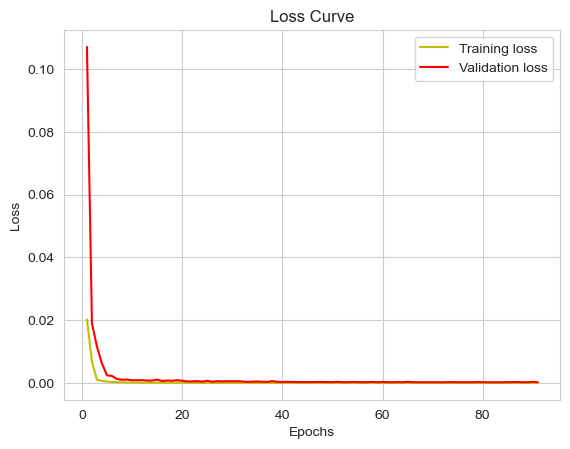

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirection  (None, 256)               133120    
 al)                                                             
                                                                 
 dense (Dense)               (None, 64)                16448     
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 149633 (584.50 KB)
Trainable params: 149633 (584.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
#model.reset_states() #this is only if running the model again
model = bidirectional_lstm()
model.summary()

In [ ]:
# Use the trained model to predict stock prices for the test set
predicted = model.predict(x_test)

# Inverse transform the predicted values to their original scale
predicted = sc.inverse_transform(predicted)

19/19 [==============================] - 7s 61ms/step


In [ ]:
# Calculate accuracy
np.mean(calculate_accuracy(test.values, predicted))

96.92776530587112

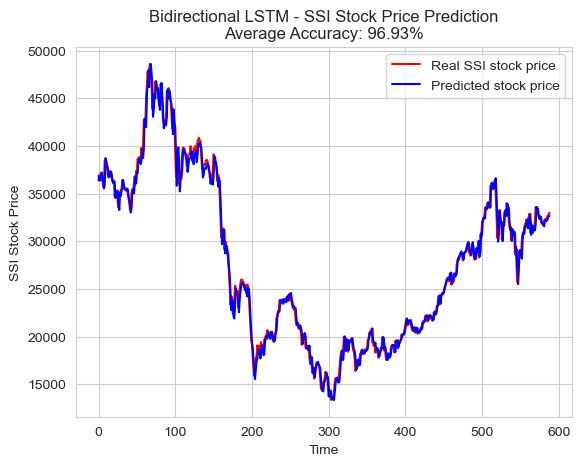

MSE: 710032.7692361193
RMSE: 842.6344220574657
MAE: 620.5848896434635
MAPE: 2.3011704115201423
R-squared: 0.9906543586973806


In [ ]:
# visualizing the results: predicted vs test and metrics to evaluate model
model_evaluation(test.values, predicted, 'Bidirectional LSTM')

The bidirectional LSTM shows more predicting power than the previous LSTM models with nearly 97%.

### b. Gated Recurrent Unit (GRU) Model

This architecture employs four GRU (Gated Recurrent Unit) layers with dropout regularization and a dense output layer for regression.

- GRU Layers: Four GRU layers are stacked sequentially. Each GRU layer has 50 units and uses the hyperbolic tangent (tanh) activation function. All GRU layers, except the last one, have return_sequences=True, implying they output sequences to the subsequent layers.

- Dropout Regularization: Dropout layers (with a rate of 0.2) are included after each GRU layer. Dropout helps prevent overfitting by randomly deactivating connections during training.

- Output Layer: A single-unit dense layer is added as the output layer without specifying an activation function. For regression tasks (using mean squared error as the loss), a linear activation function is typically used by default.

- Compilation and Training: The model is compiled using Stochastic Gradient Descent (SGD) with a momentum of 0.9 and without Nesterov momentum.

- Training configuration involves 100 epochs, a batch size of 32, and a validation split of 20%. There are callbacks (named callbacks) used, likely for tasks like early stopping and learning rate schedule.

In [ ]:
from tensorflow.keras.optimizers import SGD
# The 4-same-layer GRU
def basic_gru():
    # The GRU architecture
    model = Sequential()
    # First GRU layer with Dropout regularisation
    model.add(GRU(units=50, return_sequences=True, input_shape=(x_train.shape[1],1), activation='tanh'))
    model.add(Dropout(0.2))
    # Second GRU layer
    model.add(GRU(units=50, return_sequences=True, input_shape=(x_train.shape[1],1), activation='tanh'))
    model.add(Dropout(0.2))
    # Third GRU layer
    model.add(GRU(units=50, return_sequences=True, input_shape=(x_train.shape[1],1), activation='tanh'))
    model.add(Dropout(0.2))
    # Fourth GRU layer
    model.add(GRU(units=50, activation='tanh'))
    model.add(Dropout(0.2))
    # The output layer
    model.add(Dense(units=1))

    # Compiling the model with the legacy optimizer
    model.compile(optimizer=SGD(momentum=0.9, nesterov=False), loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])

    # Fitting the model with the learning rate scheduler
    history = model.fit(x_train, y_train, validation_split=0.2, epochs=100, batch_size=32, callbacks=callbacks)

    plot_loss_curve(history)

    return model

Epoch 1/100
58/58 [==============================] - 29s 202ms/step - loss: 0.0282 - mean_absolute_error: 0.1442 - val_loss: 0.1408 - val_mean_absolute_error: 0.2944 - lr: 1.0000e-06
Epoch 2/100
58/58 [==============================] - 10s 170ms/step - loss: 0.0244 - mean_absolute_error: 0.1311 - val_loss: 0.1242 - val_mean_absolute_error: 0.2651 - lr: 3.4300e-05
Epoch 3/100
58/58 [==============================] - 10s 166ms/step - loss: 0.0162 - mean_absolute_error: 0.1036 - val_loss: 0.1016 - val_mean_absolute_error: 0.2203 - lr: 6.7600e-05
Epoch 4/100
58/58 [==============================] - 7s 117ms/step - loss: 0.0099 - mean_absolute_error: 0.0792 - val_loss: 0.0855 - val_mean_absolute_error: 0.1870 - lr: 1.0090e-04
Epoch 5/100
58/58 [==============================] - 10s 165ms/step - loss: 0.0078 - mean_absolute_error: 0.0681 - val_loss: 0.0778 - val_mean_absolute_error: 0.1746 - lr: 1.3420e-04
Epoch 6/100
58/58 [==============================] - 5s 85ms/step - loss: 0.0073 - mea

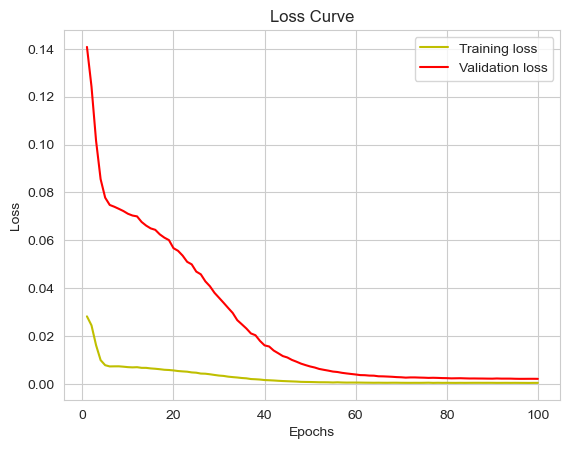

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_36 (GRU)                (None, 60, 50)            7950      
                                                                 
 dropout_36 (Dropout)        (None, 60, 50)            0         
                                                                 
 gru_37 (GRU)                (None, 60, 50)            15300     
                                                                 
 dropout_37 (Dropout)        (None, 60, 50)            0         
                                                                 
 gru_38 (GRU)                (None, 60, 50)            15300     
                                                                 
 dropout_38 (Dropout)        (None, 60, 50)            0         
                                                                 
 gru_39 (GRU)                (None, 50)              

In [ ]:
model.reset_states() #this is only if running the model again
model = basic_gru()
model.summary()

In [ ]:
# predicting the stock prices for test set and scaled back to orginal values
predicted_with_gru = model.predict(x_test)
predicted_with_gru = sc.inverse_transform(predicted_with_gru)

19/19 [==============================] - 3s 36ms/step


In [ ]:
# Calculate accuracy
np.mean(calculate_accuracy(test.values, predicted_with_gru))

91.83357480734628

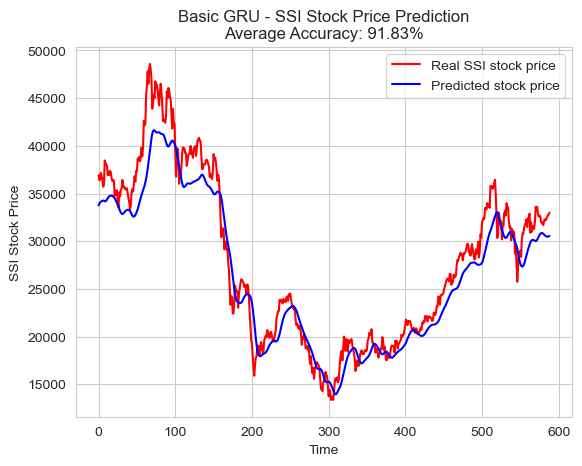

MSE: 6249567.909624493
RMSE: 2499.91358043123
MAE: 1975.2167123169568
MAPE: 6.833404177042037
R-squared: 0.9177415148845209


In [ ]:
# visualizing the results: predicted vs test and metrics to evaluate model
model_evaluation(test.values, predicted_with_gru, 'Basic GRU')

The result shows that the 4-same-layer GRU with more than 91% has better prediction than same-layer LSTM architectures although this accuracy of GRU is not as high as the other complex LSTM model.

### c. Transformers Model

**Set up**

In [ ]:
import numpy as np
import pandas as pd
import os, datetime
import tensorflow as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import sqlite3
import pandas as pd
import math

#For reproducability
from numpy.random import seed
seed(1)
tf.random.set_seed(2)

2024-01-01 18:47:09.217622: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
import tensorflow as tf

# Retrieve and display the list of attributes and methods within tf.keras.layers
dir(tf.keras.layers)

['AbstractRNNCell',
 'Activation',
 'ActivityRegularization',
 'Add',
 'AdditiveAttention',
 'AlphaDropout',
 'Attention',
 'Average',
 'AveragePooling1D',
 'AveragePooling2D',
 'AveragePooling3D',
 'AvgPool1D',
 'AvgPool2D',
 'AvgPool3D',
 'BatchNormalization',
 'Bidirectional',
 'CategoryEncoding',
 'CenterCrop',
 'Concatenate',
 'Conv1D',
 'Conv1DTranspose',
 'Conv2D',
 'Conv2DTranspose',
 'Conv3D',
 'Conv3DTranspose',
 'ConvLSTM1D',
 'ConvLSTM2D',
 'ConvLSTM3D',
 'Convolution1D',
 'Convolution1DTranspose',
 'Convolution2D',
 'Convolution2DTranspose',
 'Convolution3D',
 'Convolution3DTranspose',
 'Cropping1D',
 'Cropping2D',
 'Cropping3D',
 'Dense',
 'DenseFeatures',
 'DepthwiseConv1D',
 'DepthwiseConv2D',
 'Discretization',
 'Dot',
 'Dropout',
 'ELU',
 'EinsumDense',
 'Embedding',
 'Flatten',
 'GRU',
 'GRUCell',
 'GaussianDropout',
 'GaussianNoise',
 'GlobalAveragePooling1D',
 'GlobalAveragePooling2D',
 'GlobalAveragePooling3D',
 'GlobalAvgPool1D',
 'GlobalAvgPool2D',
 'GlobalAvgPo

**Helpful functions**

In [ ]:
# Function to calculate model accuracy
def calculate_accuracy(real, predict):
    real = np.array(real) + 1
    predict = np.array(predict) + 1
    percentage = 1 - np.sqrt(np.mean(np.square((real - predict) / real)))
    return percentage * 100

In [ ]:
# function which plots ssi stock prices: real and predicted both and show evaluation metrics

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

def model_evaluation (test, predicted, model_name):
    def calculate_accuracy(real, predict):
        real = np.array(real) + 1
        predict = np.array(predict) + 1
        percentage = 1 - np.sqrt(np.mean(np.square((real - predict) / real)))
        return percentage * 100

    accuracy = calculate_accuracy(test, predicted)

    plt.plot(test, color="red", label="Real SSI stock price")
    plt.plot(predicted, color="blue", label="Predicted stock price")
    plt.title(f"{model_name} - SSI Stock Price Prediction\nAverage Accuracy: {np.mean(accuracy):.2f}%")
    plt.xlabel("Time")
    plt.ylabel("SSI Stock Price")
    plt.legend()
    plt.show()

    def calculate_metrics(actual, predicted):
        # Mean Squared Error (MSE)
        mse = mean_squared_error(actual, predicted)
        # Root Mean Squared Error (RMSE)
        rmse = np.sqrt(mse)
        # Mean Absolute Error (MAE)
        mae = mean_absolute_error(actual, predicted)
        # Mean Absolute Percentage Error (MAPE)
        mape = np.mean(np.abs((actual - predicted) / actual)) * 100
        # R-squared (R2)
        r2 = r2_score(actual, predicted)
        return mse, rmse, mae, mape, r2
    mse, rmse, mae, mape, r2 = calculate_metrics(test, predicted)
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAE: {mae}")
    print(f"MAPE: {mape}")
    print(f"R-squared: {r2}")

In [ ]:
# Function to plot the training loss and validation loss
def plot_loss_curve(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'y', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

**Data Preprocessing**

In [ ]:
import pandas as pd

# Read the CSV file 'ssi.csv' into a Pandas DataFrame, parsing the 'time' column as dates
df = pd.read_csv('ssi.csv', parse_dates=['time'])

# Replace any occurrences of 0 in the 'volume' column with the last valid value forward-filled
df['volume'].replace(to_replace=0, method='ffill', inplace=True)

# Create a new DataFrame 'df_close' containing only the 'close' column from the original DataFrame
df_close = df['close']

# Display the first few rows of the 'df_close' DataFrame
df_close.head()

0    5290
1    5380
2    5270
3    5460
4    5380
Name: close, dtype: int64

In [ ]:
'''Create indexes to split dataset'''
# Get all the time indexes in the dataset and sort them
times = sorted(df_close.index.values)

# Calculate the index that represents the last 10% of the time series
last_10pct = sorted(df_close.index.values)[-int(0.1 * len(times))]

# Calculate the index that represents the last 20% of the time series
last_20pct = sorted(df_close.index.values)[-int(0.2 * len(times))]

In [ ]:
'''Create training, validation and test split'''

# Extract the training data (first 80% of the time series)
df_train = df_close[df_close.index < last_20pct]

# Extract the test data (last 20% of the time series)
df_test = df_close[df_close.index >= last_20pct]

# The validation data section has been commented out in this snippet
# Uncomment and modify if needed to use validation data
# df_val = df[(df.index >= last_20pct) & (df.index < last_10pct)]

2356    36390
2357    36450
2358    37160
2359    36800
2360    36450
Name: close, dtype: int64

In [ ]:
# Reshaping the training and test data into numpy arrays
training_set = df_train.values.reshape(-1, 1)
test_set = df_test.values.reshape(-1, 1)

# Printing the shapes of the training and test sets
print(training_set.shape)  # Display the shape of the training set
print(test_set.shape)  # Display the shape of the test set

# Output the test set values
test_set

(2356, 1)
(588, 1)


array([[36390],
       [36450],
       [37160],
       [36800],
       [36450],
       [35720],
       [35970],
       [38470],
       [38210],
       [38070],
       [37900],
       [36950],
       [37290],
       [36950],
       [37380],
       [37210],
       [36600],
       [36330],
       [36430],
       [36330],
       [34770],
       [35290],
       [34860],
       [35340],
       [34080],
       [33550],
       [35120],
       [34720],
       [35380],
       [35510],
       [36430],
       [35980],
       [35640],
       [35640],
       [35430],
       [35510],
       [35550],
       [35030],
       [34510],
       [34080],
       [33290],
       [33720],
       [35120],
       [35460],
       [35200],
       [35980],
       [36810],
       [36240],
       [37380],
       [37290],
       [38680],
       [38500],
       [38850],
       [38380],
       [38760],
       [39810],
       [38900],
       [39850],
       [42630],
       [42160],
       [42250],
       [45200],
       [

In [ ]:
# Scaling the training set
sc = MinMaxScaler(feature_range=(0, 1))
training_set_scaled = sc.fit_transform(training_set)

# Scaling the test set
test_set_scaled = sc.fit_transform(test_set)


In [ ]:
timesteps = 8
# First, we create data sets where each sample has with 8 timesteps and 1 output
# So for each element of training set, we have 8 previous training set elements
x_train = []
y_train = []

# Iterating through the training_set_scaled to create sequences of timesteps length
for i in range(timesteps, training_set.shape[0]):
    # Append sequences of length timesteps as x_train
    x_train.append(training_set_scaled[i - timesteps : i, 0])
    # Append the next value after the sequence as y_train
    y_train.append(training_set_scaled[i, 0])

# Converting the lists to numpy arrays
x_train, y_train = np.array(x_train), np.array(y_train)

# Printing the first two elements to demonstrate the sequence pairs
print(x_train[0], y_train[0])
print(x_train[1], y_train[1])

# Notice how the first y_train value becomes the last X_train value for the next sample

[0.03964497 0.04230769 0.03905325 0.04467456 0.04230769 0.03431953
 0.03431953 0.02899408] 0.026627218934911254
[0.04230769 0.03905325 0.04467456 0.04230769 0.03431953 0.03431953
 0.02899408 0.02662722] 0.03372781065088758


In [ ]:
# Printing the shapes of x_train and y_train before reshaping
print(x_train.shape, y_train.shape)

# Reshaping the x_train data to fit the input shape (samples, timesteps, features)
x_train = x_train.reshape((x_train.shape[0], x_train.shape[1], 1))

# Printing the shapes of x_train and y_train after reshaping
print(x_train.shape, y_train.shape)


(2348, 8) (2348,)
(2348, 8, 1) (2348,)


In [ ]:
print(x_train.shape, y_train.shape)
# Interestingly - randomly arranging the samples works well, since we are using validation_split = 0.2, (rather then validation_data = )
# It is worth looking into whether using a K-fold would work better - if so would not use random permutation.
idx = np.random.permutation(len(x_train))

# Rearrange the training data using the randomly shuffled indices
x_train = x_train[idx]
y_train = y_train[idx]

(2348, 8, 1) (2348,)


**Building Transformer Model**

This code defines a single layer within a Transformer Encoder, comprising several fundamental components:

- Layer Normalization: This layer helps stabilize the training process by normalizing the inputs using Layer Normalization with a small epsilon value to avoid numerical instability.

- Multi-Head Self-Attention Mechanism: The layer utilizes Multi-Head Attention, a pivotal component in Transformers, to capture relationships between different positions within the input sequence.

- Dropout Regularization: Dropout is applied after both the attention mechanism and the 1D convolutional layers to prevent overfitting by randomly dropping out connections during training.

- Residual Connections: These connections enable the gradient to flow more easily during training by adding the original input to the output of the attention layer and the output of the convolutional layer.

- Feed Forward Network (FFN): The FFN part consists of a 1D Convolutional Neural Network (CNN) with ReLU activation followed by another 1D CNN without an activation function. This structure helps the model learn non-linear relationships within the data.

- Parameter Configurability: The function accepts parameters like head_size, num_heads, ff_dim, and dropout to control the size of attention heads, the dimension of feed-forward layers, and the dropout rate.

In [ ]:
# A basic structure of a single layer within a Transformer Encoder
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Normalization and Attention
    # EMBEDDING LAYER
    # Apply Layer Normalization to the input data
    x = layers.LayerNormalization(epsilon=1e-6)(inputs)

    # ATTENTION LAYER
    # Apply Multi-Head Self-Attention Mechanism
    x = layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(x, x)
    # Apply dropout regularization
    x = layers.Dropout(dropout)(x)

    # Residual Connection
    # Add the original inputs to the attention output
    res = x + inputs

    # FEED FORWARD Part
    # Apply Layer Normalization to the residual connection
    x = layers.LayerNormalization(epsilon=1e-6)(res)
    # Apply 1D Convolutional Neural Network with ReLU activation
    x = layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    # Apply dropout regularization
    x = layers.Dropout(dropout)(x)
    # Apply 1D Convolutional Neural Network without activation
    x = layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)

    # Residual Connection
    # Add the residual connection to the output of the convolutional layer
    return x + res

This model-building function creates a sequence-to-one regression model using a stack of Transformer Encoder blocks followed by additional fully connected layers (Multi-Layer Perceptron - MLP) and a final output layer.

- Transformer Encoder Blocks: It iterates over the num_transformer_blocks to stack multiple Transformer Encoder blocks using the transformer_encoder function. Each block captures relationships and patterns within the input sequence.

- Global Average Pooling: After the Transformer Encoder blocks, a Global Average Pooling layer is applied to summarize the sequence information across channels, condensing the output of the Transformer blocks into a fixed-length representation.

- MLP Layers: The function adds additional fully connected layers (MLP) specified by the mlp_units parameter. Each dense layer utilizes the ELU activation function, followed by dropout regularization using the mlp_dropout rate.

- Output Layer: The final output layer consists of a single unit with a linear activation function, suitable for regression tasks where the model directly predicts a continuous output value.

- Keras Model Creation: The function assembles and returns a Keras Model using the specified inputs and outputs.

This architecture leverages the Transformer Encoder blocks for sequence processing and then employs fully connected layers to further process the summarised sequence information. It's suitable for regression tasks where input sequences are processed and mapped to a single output value.

In [ ]:
def build_model(
    input_shape,
    head_size,
    num_heads,
    ff_dim,
    num_transformer_blocks,
    mlp_units,
    dropout=0,
    mlp_dropout=0,
):
    # Define the input layer for the model
    inputs = keras.Input(shape=input_shape)
    x = inputs

    # Stack multiple Transformer Encoder blocks
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    # Global Average Pooling to summarize sequence information
    x = layers.GlobalAveragePooling1D(data_format="channels_first")(x)

    # Additional fully connected layers (MLP)
    for dim in mlp_units:
        x = layers.Dense(dim, activation="elu")(x)
        x = layers.Dropout(mlp_dropout)(x)

    # Final output layer with linear activation
    outputs = layers.Dense(1, activation="linear")(x)  # Pass-through layer

    # Define the Keras model with inputs and outputs
    return keras.Model(inputs, outputs)

In [ ]:
def lr_scheduler(epoch, lr, warmup_epochs=30, decay_epochs=100, initial_lr=1e-6, base_lr=1e-3, min_lr=5e-5):
    # Linear warm-up phase for the initial epochs
    if epoch <= warmup_epochs:
        pct = epoch / warmup_epochs
        return ((base_lr - initial_lr) * pct) + initial_lr

    # Exponential decay phase after warm-up
    if epoch > warmup_epochs and epoch < warmup_epochs + decay_epochs:
        pct = 1 - ((epoch - warmup_epochs) / decay_epochs)
        return ((base_lr - min_lr) * pct) + min_lr

    # If epoch exceeds the defined warm-up and decay epochs, maintain the minimum learning rate
    return min_lr

In [ ]:
from tensorflow import keras

# Callbacks for the training process
callbacks = [
    # EarlyStopping: Interrupts training when a monitored metric has stopped improving.
    keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),

    # LearningRateScheduler: Adjusts the learning rate during training using a custom schedule.
    keras.callbacks.LearningRateScheduler(lr_scheduler)
]

In [ ]:
# Determine and display the shape of the input data (excluding batch size)
input_shape = x_train.shape[1:]
print(input_shape)

(8, 1)


**Training Model**

In [ ]:
# Building and training a custom transformer-based model
from tensorflow.keras import layers

# Create the model with specified architecture and hyperparameters
model = build_model(
    input_shape,
    head_size=46,  # Embedding size for attention
    num_heads=60,  # Number of attention heads
    ff_dim=55,  # Hidden layer size in the feedforward network inside the transformer
    num_transformer_blocks=5,
    mlp_units=[256],
    mlp_dropout=0.4,
    dropout=0.14,
)

# Compile the model with optimizer, loss function, and metrics
model.compile(
    loss="mean_squared_error",
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["mean_squared_error"],
)

# Train the model using the provided training data and validation split, with specified epochs and batch size
history = model.fit(
    x_train,
    y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    callbacks=callbacks,
)

Epoch 1/100
59/59 [==============================] - 42s 315ms/step - loss: 0.0376 - mean_squared_error: 0.0376 - val_loss: 0.0390 - val_mean_squared_error: 0.0390 - lr: 1.0000e-06
Epoch 2/100
59/59 [==============================] - 12s 195ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0096 - val_mean_squared_error: 0.0096 - lr: 3.4300e-05
Epoch 3/100
59/59 [==============================] - 22s 371ms/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0025 - val_mean_squared_error: 0.0025 - lr: 6.7600e-05
Epoch 4/100
59/59 [==============================] - 13s 220ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 7.3471e-04 - val_mean_squared_error: 7.3471e-04 - lr: 1.0090e-04
Epoch 5/100
59/59 [==============================] - 18s 307ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 2.8608e-04 - val_mean_squared_error: 2.8608e-04 - lr: 1.3420e-04
Epoch 6/100
59/59 [==============================] - 21s 358ms/step - loss: 0.0

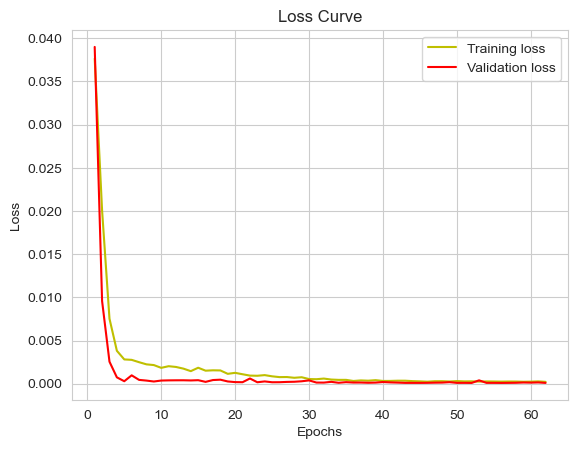

In [ ]:
# Plot the training and validation loss
plot_loss_curve(history)

**Testing Model**

In [ ]:
# First we have to frontload the test data before the inital values of our test_set

# Creating input sequences for the test data using the trained scaler from training data
# Concatenating the training and test data to ensure consistent scaling
dataset_total = pd.concat((df_train, df_test), axis=0)

# Selecting the required input data for the test set with appropriate timesteps
inputs = dataset_total[len(dataset_total) - len(test_set) - timesteps:].values
inputs = inputs.reshape(-1, 1)
inputs = sc.fit_transform(inputs)  # Scaling the combined data

# Creating sequences for the test set with appropriate timesteps
X_test = []
for i in range(timesteps, test_set.shape[0] + timesteps):
    X_test.append(inputs[i - timesteps:i, 0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [ ]:
# Predicting the stock prices for the test set using the trained model
predicted_stock_price = model.predict(X_test)

# Inversing the scaling to get the actual predicted stock prices
output_predict = sc.inverse_transform(predicted_stock_price)

# Display the predictions
output_predict

19/19 [==============================] - 6s 95ms/step


array([[37345.3  ],
       [37010.164],
       [36833.926],
       [37182.62 ],
       [37110.32 ],
       [36807.746],
       [36456.945],
       [36364.67 ],
       [37894.875],
       [38155.09 ],
       [38227.586],
       [38531.21 ],
       [37895.23 ],
       [37778.94 ],
       [37518.973],
       [37458.023],
       [37464.45 ],
       [37089.875],
       [36824.777],
       [36842.492],
       [36626.867],
       [35575.953],
       [35601.008],
       [35304.11 ],
       [35352.75 ],
       [34664.207],
       [34131.023],
       [34969.188],
       [34920.004],
       [35227.58 ],
       [35748.926],
       [36401.457],
       [36392.195],
       [36253.16 ],
       [36163.2  ],
       [35966.168],
       [35817.125],
       [35852.28 ],
       [35459.867],
       [35053.69 ],
       [34662.918],
       [33927.797],
       [33920.527],
       [34791.637],
       [35229.195],
       [35358.49 ],
       [36146.832],
       [36908.125],
       [36714.363],
       [37481.27 ],


In [ ]:
# Display actual values
test_set

array([[36390],
       [36450],
       [37160],
       [36800],
       [36450],
       [35720],
       [35970],
       [38470],
       [38210],
       [38070],
       [37900],
       [36950],
       [37290],
       [36950],
       [37380],
       [37210],
       [36600],
       [36330],
       [36430],
       [36330],
       [34770],
       [35290],
       [34860],
       [35340],
       [34080],
       [33550],
       [35120],
       [34720],
       [35380],
       [35510],
       [36430],
       [35980],
       [35640],
       [35640],
       [35430],
       [35510],
       [35550],
       [35030],
       [34510],
       [34080],
       [33290],
       [33720],
       [35120],
       [35460],
       [35200],
       [35980],
       [36810],
       [36240],
       [37380],
       [37290],
       [38680],
       [38500],
       [38850],
       [38380],
       [38760],
       [39810],
       [38900],
       [39850],
       [42630],
       [42160],
       [42250],
       [45200],
       [

In [ ]:
# Calculate the model accuracy
accuracy = calculate_accuracy(test_set,output_predict)
np.mean(accuracy)

96.54892530057387

**Model Evalution**

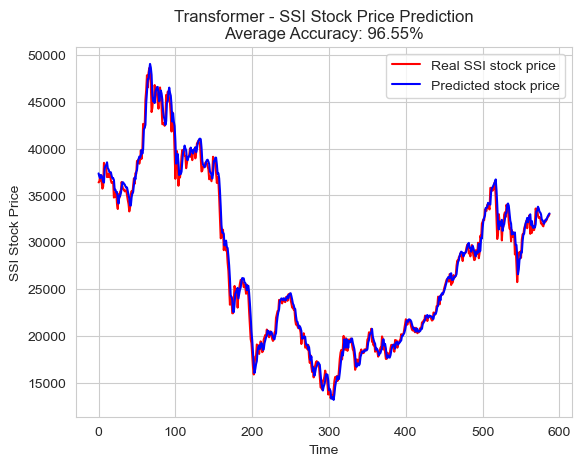

MSE: 858497.7853314114
RMSE: 926.5515556791275
MAE: 658.1946215986394
MAPE: 2.4802462907005083
R-squared: 0.9886989625720546


In [ ]:
model_evaluation(test_set,output_predict, 'Transformer')

The accuracy of predictions using transformer, which is more than 96%, just lower than bidirectional LSTM model and ARIMA model.

## 5. Conclusion

In [ ]:
!pip install prettytable
!pip install tabulate
from prettytable import PrettyTable

In [ ]:
from tabulate import tabulate

data = [
    ["ARIMA", 96.99, 667859.13, 817.27, 592.65, 2.22, 0.99],
    ["LSTM (2-same-layer)", 90.35, 10394602.69, 3224.07, 2589.03, 8.47, 0.86],
    ["LSTM (3-same-layer)", 89.94, 10789005.30, 3284.66, 2637.78, 8.75, 0.86],
    ["LSTM (2-different-layer)", 95.42, 1628088.71, 1275.97, 904.04, 3.30, 0.98],
    ["LSTM (4-different-layer)", 90.71, 5716696.28, 2390.96, 1826, 6.93, 0.92],
    ["LSTM (Bidirectional)", 96.93, 710032.77, 842.63, 620.58, 2.30, 0.99],
    ["GRU (4-same-layer)", 91.83, 91.83, 2499.91, 1975.22, 6.83, 0.92],
    ["Transformer", 96.55, 858497.79, 926.55, 658.19, 2.48, 0.99]
]

headers = ["Model", "Accuracy", "MSE", "RMSE", "MAE", "MAPE", "R-Square"]

print(tabulate(data, headers=headers, floatfmt=".2f", tablefmt="pretty"))


+--------------------------+----------+-------------+---------+---------+------+----------+
|          Model           | Accuracy |     MSE     |  RMSE   |   MAE   | MAPE | R-Square |
+--------------------------+----------+-------------+---------+---------+------+----------+
|          ARIMA           |  96.99   |  667859.13  | 817.27  | 592.65  | 2.22 |   0.99   |
|   LSTM (2-same-layer)    |  90.35   | 10394602.69 | 3224.07 | 2589.03 | 8.47 |   0.86   |
|   LSTM (3-same-layer)    |  89.94   | 10789005.3  | 3284.66 | 2637.78 | 8.75 |   0.86   |
| LSTM (2-different-layer) |  95.42   | 1628088.71  | 1275.97 | 904.04  | 3.3  |   0.98   |
| LSTM (4-different-layer) |  90.71   | 5716696.28  | 2390.96 |  1826   | 6.93 |   0.92   |
|   LSTM (Bidirectional)   |  96.93   |  710032.77  | 842.63  | 620.58  | 2.3  |   0.99   |
|    GRU (4-same-layer)    |  91.83   |    91.83    | 2499.91 | 1975.22 | 6.83 |   0.92   |
|       Transformer        |  96.55   |  858497.79  | 926.55  | 658.19  | 2.48 |

In conclusion, when comparing both traditional echometric and deep learning models, surprisingly the traditional one gives the highest results in average accuracy, the second place is the bidirectional LSTM model, and the Transformer holds the third place. These three models all have the very high R-Square (0.99) suggests a good fit to the data. Models like LSTM (2-different-layer), Bidirectional LSTM, and Transformer demonstrate promising performance with high accuracy and low error metrics, making them competitive alternatives to ARIMA for stock price prediction.

There are several contrasts between the ARIMA model and these AI models:
-	Interpretability: ARIMA models are relatively simpler and easier to interpret compared to complex neural network architectures.
-	Training Time: AI models often require more computational resources and training time compared to ARIMA, especially with deep learning models like LSTM, GRU, and Transformer.
-	Performance: While ARIMA performs admirably, some AI models demonstrate comparable accuracy and superior performance in specific cases, particularly when handling nonlinear relationships or capturing complex patterns in data.

ARIMA outperforms most neural network-based models in terms of accuracy and error metrics, except for the LSTM (2-different-layer) and Transformer models. The first reason is that the length of the sequence being predicted is short, just one output. It is believe that as longer predicted length of output the AI models will outperform. Also, this may because the ARIMA model we have use automation to choose the best parameter while these deep learning model can vary significantly on hyperparameters. The choice of architecture and the number of layers significantly affect the performance, as seen in variations across LSTM models. Adjusting these factors might further improve model accuracy.

In essence, while ARIMA shows strong performance and interpretability, AI models present competitive accuracy and predictive capabilities. The choice between ARIMA and AI models often depends on the specific context, computational resources, interpretability needs, and the nature of the dataset. AI models may offer advantages in capturing intricate patterns but may require more resources and expertise in model tuning.
